# YOU NEEED: 
    - 150 GB to run
    - Lots of DASK

In [1]:
import xarray as xr
import numpy as np
import pandas as pd
import glob
import scipy
import copy
import math
import time

#plotting with Cartopy. 
import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from matplotlib import cm
from matplotlib import rc
#rc('font',**{'family':'sans-serif','sans-serif':['Helvetica']})
rc('font',**{'family':'serif','serif':['Times']})
rc('text', usetex=True)
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib import ticker


# import scipy
from datetime import datetime
import os
# import utils
import importlib


# import statsmodels.api as sm
# from windspharm.xarray import VectorWind
# from windspharm.standard import VectorWind
# from windspharm.examples import example_data_path
# from windspharm.tools import prep_data, recover_data, order_latdim
from scipy import stats
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

from shapely.geometry.polygon import LinearRing
from dask.diagnostics import ProgressBar
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import matplotlib.patches as mpatches
import math
import statsmodels.api as sm
from statsmodels.graphics import tsaplots
import geocat.comp as gcomp
import shutil
import metpy.calc as mpcalc


## Papers which inform 
- Tendency Bias Correction in Coupled and Uncoupled Global Climate Models with a Focus on Impacts over North America

# Experiments: 
    -Free Running: 
        -/glade/campaign/cisl/aiml/wchapman/CAM_runs/f.e21.DAcompset.f09_d025_free_MJO_1982
        - path_tofiles=/glade/campaign/cisl/aiml/wchapman/CAM_runs/' + modvers + '/atm/hist/*h1*.nc
    -Nudge No Stochai: 
        -/glade/scratch/wchapman/archive/f.e21.DAcompset.f09_d025_Seasonal_stochai_UV_00_1982
    -Nudge Stochai
        -/glade/scratch/wchapman/archive/f.e21.DAcompset.f09_d025_Seasonal_stochai_UV_05_1982_MJO_v3
        - path_tofiles='/glade/scratch/wchapman/archive/' + modvers + '/atm/hist/*h1*.nc'
    -DA No Stochai: 
        -/glade/scratch/wchapman/archive/f.e21.DAcompset.f09_d025_Seasonal_DA_stochai_UV_00_1982
    -DA Stochai
        -/glade/scratch/wchapman/archive/f.e21.DAcompset.f09_d025_Seasonal_DA_stochai_UV_05_1982/
    -obs
        -/glade/scratch/wchapman/TEMPERAI/

## Get ADF to do this for you

In [2]:
if 'client' in locals():
    client.shutdown()
    print('...shutdown client...')
else:
    print('client does not exist yet')

client does not exist yet


In [6]:
from distributed import Client
from ncar_jobqueue import NCARCluster

cluster = NCARCluster(project='P54048000',walltime='06:00:00')
cluster.scale(40)
client = Client(cluster)
client

/glade/u/apps/opt/conda/envs/npl-2023a/lib/python3.9/site-packages/dask_jobqueue/core.py:255: FutureWarning: job_extra has been renamed to job_extra_directives. You are still using it (even if only set to []; please also check config files). If you did not set job_extra_directives yet, job_extra will be respected for now, but it will be removed in a future release. If you already set job_extra_directives, job_extra is ignored and you can remove it.
  warnings.warn(warn, FutureWarning)
/glade/u/apps/opt/conda/envs/npl-2023a/lib/python3.9/site-packages/dask_jobqueue/core.py:274: FutureWarning: env_extra has been renamed to job_script_prologue. You are still using it (even if only set to []; please also check config files). If you did not set job_script_prologue yet, env_extra will be respected for now, but it will be removed in a future release. If you already set job_script_prologue, env_extra is ignored and you can remove it.
  warnings.warn(warn, FutureWarning)
/glade/u/apps/opt/conda

Connection method: Cluster object,Cluster type: dask_jobqueue.PBSCluster
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/wchapman/3rd_EOFs/proxy/8787/status,
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/wchapman/3rd_EOFs/proxy/8787/status,Workers: 0
Total threads: 0,Total memory: 0 B
Comm: tcp://10.12.206.9:43145,Workers: 0
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/wchapman/3rd_EOFs/proxy/8787/status,Total threads: 0
Started: 2 minutes ago,Total memory: 0 B


## Free Running:

### helpful functions

In [7]:
def chunker(seq, size):
    return (seq[pos:pos + size] for pos in range(0, len(seq), size))


def wgt_rmse(fld1, fld2, wgt):
    """Calculated the area-weighted RMSE.
    Inputs are 2-d spatial fields, fld1 and fld2 with the same shape.
    They can be xarray DataArray or numpy arrays.
    Input wgt is the weight vector, expected to be 1-d, matching length of one dimension of the data.
    Returns a single float value.
    """
    assert len(fld1.shape) == 2,     "Input fields must have exactly two dimensions."
    assert fld1.shape == fld2.shape, "Input fields must have the same array shape."
    # in case these fields are in dask arrays, compute them now.
    if hasattr(fld1, "compute"):
        fld1 = fld1.compute()
    if hasattr(fld2, "compute"):
        fld2 = fld2.compute()
    if isinstance(fld1, xr.DataArray) and isinstance(fld2, xr.DataArray):
        return (np.sqrt(((fld1 - fld2)**2).weighted(wgt).mean())).values.item()
    else:
        check = [len(wgt) == s for s in fld1.shape]
        if ~np.any(check):
            raise IOError(f"Sorry, weight array has shape {wgt.shape} which is not compatible with data of shape {fld1.shape}")
        check = [len(wgt) != s for s in fld1.shape]
        dimsize = fld1.shape[np.argwhere(check).item()]  # want to get the dimension length for the dim that does not match the size of wgt
        warray = np.tile(wgt, (dimsize, 1)).transpose()   # May need more logic to ensure shape is correct.
        warray = warray / np.sum(warray) # normalize
        wmse = np.nansum(warray * (fld1 - fld2)**2)
        return np.sqrt( wmse ).item()

#######


## Load Free

In [8]:
%%time 
modvers = 'f.e21.DAcompset.f09_d025_free_MJO_1982'
fil_out = '/glade/scratch/wchapman/CESM_h0_summaryfiles/' + modvers +'_h0summary.nc'
path_tofiles='/glade/campaign/cisl/aiml/wchapman/CAM_runs/' + modvers + '/atm/hist/*h0*.nc'
remake_files = False
dovars = ['OMEGA','U','V','T','Q','Z3','TS','TAUX','TAUY','TAUGWX','TAUGWY','PRECC','PRECL','TREFHT','QFLX','LANDFRAC','PSL','PS','P0','hyam','hybm']
save_var = 'Z3'

if (os.path.exists(fil_out)) & (remake_files):
    os.remove(fil_out)

if not os.path.exists(fil_out):
    fns = sorted(glob.glob(path_tofiles))
    program_starts = time.time()

    for ee,group in enumerate(chunker(fns,12)):
        print('doing group: ',ee)
        # print(group)
        DS = xr.open_mfdataset(group,parallel=True)
        print('..opened..')
        if ee == 0:
            bbedo = DS[dovars].load()
        else: 
            temp_bbedo = DS[dovars].load()
            print('concat')
            bbedo = xr.concat([bbedo,temp_bbedo],dim='time')

        now = time.time()
        print("It has been {0} seconds since the loop started".format(now - program_starts))

    bbedo['time']=pd.date_range(start='1982-01-01',end='2010-12-01',freq='MS')
    
    print('...adding divergence...')
    divy = mpcalc.divergence(bbedo.U,bbedo.V)
    bbedo['DIV']=divy
    print('...done divergence...')
    bbedo.to_netcdf(fil_out)
    
else:
    print('file existed... opening')
    bbedo = xr.open_dataset(fil_out)

print('... adding precipitation and wind stress ...')
bbedo['PRECT']=bbedo['PRECC']+bbedo['PRECL']
bbedo['tau_nox'] = -(bbedo['TAUX']-bbedo['TAUGWX'])
bbedo['tau_noy'] = -(bbedo['TAUY']-bbedo['TAUGWY'])
print('... interpolation and seasonal averaging ...')
    
# interpolate to new pressure levels.
bbedo_chunked = bbedo.chunk({'time':10, 'lat':192, 'lon':288})
new_levs = np.array([3, 7, 20, 30, 50, 70, 100, 125, 150, 200, 250, 300, 350, 400, 450, 500, 600, 700, 800, 850, 900, 925, 950, 975, 1000])*100 #mb

for ee,var in enumerate(dovars[:6]+['DIV']):
    print('interpolation and seasonal average of ',var)
    Udat = gcomp.interpolation.interp_hybrid_to_pressure(bbedo_chunked[var],bbedo_chunked['PS'],bbedo_chunked['hyam'],bbedo_chunked['hybm'],100000.,new_levels=new_levs).persist()
    month_length = Udat.time.dt.days_in_month
    weights = (month_length.groupby("time.season") / month_length.groupby("time.season").sum())
    np.testing.assert_allclose(weights.groupby("time.season").sum().values, np.ones(4))
    
    if var == save_var:
        print('saving ADF style: ', var)
        Udat2 = gcomp.interpolation.interp_hybrid_to_pressure(bbedo_chunked[var],bbedo_chunked['PS'],bbedo_chunked['hyam'],bbedo_chunked['hybm'],100000.,new_levels=new_levs).persist()
        Udat2 = Udat2.rename({"plev": "lev"})
        Udat2["lev"] = Udat2["lev"] / 100.0
        Udat2 = Udat2.compute()
        Udat2 = Udat2.to_dataset(name='Z3')
        Udat2.to_netcdf('/glade/scratch/wchapman/ADF/'+modvers+'/ts/'+modvers+'.h0.'+var+'.plevs.198201-201012.nc')
       

    # Calculate the weighted average
    Udat_weighted_05 = (Udat * weights).groupby("time.season").sum(dim="time").persist()
    #compute and convert pressure levels
    
    ## ++add Annual:
    month_length = Udat.time.dt.days_in_month
    weights = month_length.groupby("time.year") / month_length.groupby("time.year").sum()
    np.testing.assert_allclose(weights.groupby("time.year").sum(xr.ALL_DIMS), 1.0)
    
    cond = Udat.isnull()
    ones = xr.where(cond, 0.0, 1.0)
    temp_sum = (Udat * weights).resample(time="AS").sum(dim="time")
    ones_sum = (ones * weights).resample(time="AS").sum(dim="time")
    average_weighted_temp = temp_sum / ones_sum
    average_weighted_temp = average_weighted_temp.mean('time')
    ANNda = average_weighted_temp.assign_coords(season='ANN')
    ANNda = ANNda.expand_dims('season')
    ## --add Annual:
    
    Udat_weighted_05 = xr.concat([Udat_weighted_05,ANNda],dim='season')
    
    
    Udat_weighted_05 = Udat_weighted_05.rename({"plev": "lev"})
    Udat_weighted_05["lev"] = Udat_weighted_05["lev"] / 100.0
    Udat_weighted_05 = Udat_weighted_05.compute()

    
    if ee == 0:
        ds_weighted = xr.Dataset({var:Udat_weighted_05.load()})
    else: 
        ds_weighted = xr.merge([ds_weighted,xr.Dataset({var:Udat_weighted_05.load()})])
        
month_length = bbedo[dovars[5:]].time.dt.days_in_month
weights = (month_length.groupby("time.season") / month_length.groupby("time.season").sum())
# np.testing.assert_allclose(weights.groupby("time.season").sum().values, np.ones(4))

# Calculate the weighted average
ds_weighted_surface = (bbedo[dovars[6:-4]+['PRECT','tau_nox','tau_noy']] * weights).groupby("time.season").sum(dim="time")
# DS.load()

## ++add Annual surface:
month_length = bbedo[dovars[6:-4]+['PRECT','tau_nox','tau_noy']].time.dt.days_in_month
weights = month_length.groupby("time.year") / month_length.groupby("time.year").sum()
np.testing.assert_allclose(weights.groupby("time.year").sum(xr.ALL_DIMS), 1.0)

cond = bbedo[dovars[6:-4]+['PRECT','tau_nox','tau_noy']].isnull()
ones = xr.where(cond, 0.0, 1.0)

temp_sum = (bbedo[dovars[6:-4]+['PRECT','tau_nox','tau_noy']] * weights).resample(time="AS").sum(dim="time")
ones_sum = (ones * weights).resample(time="AS").sum(dim="time")

average_weighted_temp_surf = temp_sum / ones_sum
average_weighted_temp_surf = average_weighted_temp_surf.mean('time')
ANNda_surf = average_weighted_temp_surf.assign_coords(season='ANN')
ANNda_surf = ANNda_surf.expand_dims('season')

ds_weighted_surface = xr.concat([ds_weighted_surface,ANNda_surf],dim='season')
## --add Annual surface:

landmask = ds_weighted_surface[['LANDFRAC','TS']].isel(season=0)
ds_weighted = xr.merge([ds_weighted,ds_weighted_surface])
# del bbedo #clearing memory 
ds_weighted

file existed... opening
... adding precipitation and wind stress ...
... interpolation and seasonal averaging ...
interpolation and seasonal average of  OMEGA
interpolation and seasonal average of  U
interpolation and seasonal average of  V
interpolation and seasonal average of  T
interpolation and seasonal average of  Q
interpolation and seasonal average of  Z3
saving ADF style:  Z3
interpolation and seasonal average of  DIV
CPU times: user 30.8 s, sys: 15.3 s, total: 46.1 s
Wall time: 2min 50s


<xarray.Dataset>
Dimensions:   (lat: 192, lon: 288, lev: 25, season: 5)
Coordinates:
  * lat       (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 88.12 89.06 90.0
  * lon       (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * lev       (lev) float64 3.0 7.0 20.0 30.0 50.0 ... 925.0 950.0 975.0 1e+03
  * season    (season) object 'DJF' 'JJA' 'MAM' 'SON' 'ANN'
Data variables: (12/21)
    OMEGA     (season, lev, lat, lon) float64 0.0 0.0 0.0 ... -0.00304 -0.00304
    U         (season, lev, lat, lon) float64 0.0 0.0 0.0 ... -1.241 -1.246
    V         (season, lev, lat, lon) float64 0.0 0.0 0.0 ... -0.237 -0.2099
    T         (season, lev, lat, lon) float64 0.0 0.0 0.0 ... 258.8 258.8 258.8
    Q         (season, lev, lat, lon) float64 0.0 0.0 0.0 ... 0.001634 0.001634
    Z3        (season, lev, lat, lon) float64 0.0 0.0 0.0 ... 115.5 115.5 115.5
    ...        ...
    QFLX      (season, lat, lon) float64 -1e-07 -1e-07 ... 1.472e-06 1.474e-06
    LANDFRAC  (season, lat, lon) float64 1.0 1.0 1.0 1.0 1.0 ... 0.0 0.0 0.0 0.0
    PSL       (season, lat, lon) float64 9.985e+04 9.985e+04 ... 1.012e+05
    PRECT     (season, lat, lon) float64 1.594e-09 1.594e-09 ... 7.287e-09
    tau_nox   (season, lat, lon) float64 -0.01599 -0.01536 ... -0.009286
    tau_noy   (season, lat, lon) float64 -0.02865 -0.02899 ... -0.006647

## Load Obs

In [9]:
ERAds2 = xr.open_dataset('/glade/work/wchapman/ERAi_Obs/ERAinterim.OTHERVARS.camgrid.1979-2010.nc').sel(time=slice('1982-01-01','2010-12-01'))
ERAds2['z'].to_netcdf('/glade/scratch/wchapman/ADF/ERAi.h0.Z3.plevs.198201-201012.nc')

In [10]:
%%time 

#if you need variable definitions, look a the files in /glade/scratch/wchapman/TEMPERAI
print('...opening...')
ERAds1 = xr.open_dataset('/glade/work/wchapman/ERAi_Obs/ERAinterim.OTHERVARS.camgrid.1979-2010.nc').sel(time=slice('1982-01-01','2010-12-01'))
ERAds2 = xr.open_dataset('/glade/work/wchapman/ERAi_Obs/ERAinterim.UV.camgrid.1979-2010.nc').sel(time=slice('1982-01-01','2010-12-01'))
ERAds3 = xr.open_dataset('/glade/work/wchapman/ERAi_Obs/ERAinterim.fc12hr.sfc.camgrid.1979-2010.nc').sel(time=slice('1982-01-01','2010-12-01'))
ERAds4 = xr.open_dataset('/glade/work/wchapman/ERAi_Obs/ERAinterim.an.sfc.camgrid.1979-2010.nc').sel(time=slice('1982-01-01','2010-12-01'))
ERAds5 = xr.open_dataset('/glade/work/wchapman/ERAi_Obs/GPCP.prec.camgrid.1979-2010.nc').sel(time=slice('1982-01-01','2010-12-01'))

ERAi = xr.merge([ERAds1,ERAds2,ERAds3,ERAds4.drop_vars("z"),ERAds5])
ERAi = ERAi.sel(time=slice('1982-01-01','2010-12-01'))

month_length = ERAi.time.dt.days_in_month
weights = (month_length.groupby("time.season") / month_length.groupby("time.season").sum())
# np.testing.assert_allclose(weights.groupby("time.season").sum().values, np.ones(4))

# Calculate the weighted average
ERAi_weighted = (ERAi.sel(level=[3, 7, 20, 30, 50, 70, 100, 125, 150, 200, 250, 300, 350, 400, 450, 500, 600, 700, 800, 850, 900, 925, 950, 975, 1000]) * weights).groupby("time.season").sum(dim="time")

month_length = ERAi.time.dt.days_in_month
weights = month_length.groupby("time.year") / month_length.groupby("time.year").sum()
np.testing.assert_allclose(weights.groupby("time.year").sum(xr.ALL_DIMS), 1.0)


print('DO ANNUAL!!!!!')
ann_varrrrs = ['u','v','t','w','q','z','t2m','ewss','nsss','precip','msl']

ERAi_weighted.load()
print('!!!! EMERGENCY!!!! select levels!!!!!')
for ee,var_ii in enumerate(ann_varrrrs):
    print('doing: ',var_ii)
    cond = ERAi[var_ii].isnull()
    ones = xr.where(cond, 0.0, 1.0)
    temp_sum = (ERAi[var_ii] * weights).resample(time="AS").sum(dim="time")
    ones_sum = (ones * weights).resample(time="AS").sum(dim="time")
    average_weighted_temp = temp_sum / ones_sum
    average_weighted_temp = average_weighted_temp.mean('time')
    ANNda = average_weighted_temp.assign_coords(season='ANN')
    ANNda = ANNda.expand_dims('season')
    
    if ee == 0:
        ERAi_ann = ANNda
        ERAi_ann = ERAi_ann.to_dataset(name=var_ii)
    else: 
        ANNda = ANNda.to_dataset(name=var_ii)
        ERAi_ann = xr.merge([ERAi_ann,ANNda])
    print('...done annual var...')

    
ERAi_weighted_ANN = xr.concat([ERAi_ann,ERAi_weighted],dim='season')
ERAi_weighted_ANN = ERAi_weighted_ANN.rename({"level": "lev"})
ERAi_weighted = ERAi_weighted.rename({"level": "lev"})

#concat annual
del ERAi

...opening...
DO ANNUAL!!!!!
!!!! EMERGENCY!!!! select levels!!!!!
doing:  u
...done annual var...
doing:  v
...done annual var...
doing:  t
...done annual var...
doing:  w
...done annual var...
doing:  q
...done annual var...
doing:  z
...done annual var...
doing:  t2m
...done annual var...
doing:  ewss
...done annual var...
doing:  nsss
...done annual var...
doing:  precip
...done annual var...
doing:  msl
...done annual var...
CPU times: user 2min 34s, sys: 3min 12s, total: 5min 46s
Wall time: 7min 45s


## Biases

# Papers which inform 
- Tendency Bias Correction in Coupled and Uncoupled Global Climate Models with a Focus on Impacts over North America

# Experiments: 
    -Free Running: 
        -/glade/campaign/cisl/aiml/wchapman/CAM_runs/f.e21.DAcompset.f09_d025_free_MJO_1982
        - path_tofiles=/glade/campaign/cisl/aiml/wchapman/CAM_runs/' + modvers + '/atm/hist/*h1*.nc
    -Nudge No Stochai: 
        -/glade/scratch/wchapman/archive/f.e21.DAcompset.f09_d025_Seasonal_stochai_UV_00_1982
    -Nudge Stochai
        -/glade/scratch/wchapman/archive/f.e21.DAcompset.f09_d025_Seasonal_stochai_UV_05_1982_MJO_v3
        - path_tofiles='/glade/scratch/wchapman/archive/' + modvers + '/atm/hist/*h1*.nc'
    -DA No Stochai: 
        -/glade/scratch/wchapman/archive/f.e21.DAcompset.f09_d025_Seasonal_DA_stochai_UV_00_1982
    -DA Stochai
        -/glade/scratch/wchapman/archive/f.e21.DAcompset.f09_d025_Seasonal_DA_stochai_UV_05_1982/
    -obs
        -/glade/scratch/wchapman/TEMPERAI/

## Load Perturbed Experiment

In [42]:
%%time 
modvers = 'f.e21.DAcompset.f09_d025_Seasonal_DA_stochai_UV_00_1982'
fil_out = '/glade/scratch/wchapman/CESM_h0_summaryfiles/' + modvers +'_h0summary.nc'
path_tofiles='/glade/scratch/wchapman/archive/' + modvers + '/atm/hist/*h0*.nc'
remake_files = False
dovars = ['OMEGA','U','V','T','Q','Z3','TS','TAUX','TAUY','TAUGWX','TAUGWY','PRECC','PRECL','TREFHT','QFLX','LANDFRAC','PSL','PS','P0','hyam','hybm']
save_var = 'Z3'

if (os.path.exists(fil_out)) & (remake_files):
    os.remove(fil_out)

if not os.path.exists(fil_out):
    fns = sorted(glob.glob(path_tofiles))
    program_starts = time.time()

    for ee,group in enumerate(chunker(fns,12)):
        print('doing group: ',ee)
        # print(group)
        DS = xr.open_mfdataset(group,parallel=True)
        print('..opened..')
        if ee == 0:
            bbedo = DS[dovars].load()
        else: 
            temp_bbedo = DS[dovars].load()
            print('concat')
            bbedo = xr.concat([bbedo,temp_bbedo],dim='time')

        now = time.time()
        print("It has been {0} seconds since the loop started".format(now - program_starts))

    bbedo['time']=pd.date_range(start='1982-01-01',end='2010-12-01',freq='MS')
    
    print('...adding divergence...')
    divy = mpcalc.divergence(bbedo.U,bbedo.V)
    bbedo['DIV']=divy
    print('...done divergence...')
    bbedo.to_netcdf(fil_out)
    
else:
    print('file existed... opening')
    bbedo = xr.open_dataset(fil_out)

print('... adding precipitation and wind stress ...')
bbedo['PRECT']=bbedo['PRECC']+bbedo['PRECL']
bbedo['tau_nox'] = -(bbedo['TAUX']-bbedo['TAUGWX'])
bbedo['tau_noy'] = -(bbedo['TAUY']-bbedo['TAUGWY'])
print('... interpolation and seasonal averaging ...')
    
# interpolate to new pressure levels.
bbedo_chunked = bbedo.chunk({'time':10, 'lat':192, 'lon':288})
new_levs = np.array([3, 7, 20, 30, 50, 70, 100, 125, 150, 200, 250, 300, 350, 400, 450, 500, 600, 700, 800, 850, 900, 925, 950, 975, 1000])*100 #mb

for ee,var in enumerate(dovars[:6]+['DIV']):
    print('interpolation and seasonal average of ',var)
    Udat = gcomp.interpolation.interp_hybrid_to_pressure(bbedo_chunked[var],bbedo_chunked['PS'],bbedo_chunked['hyam'],bbedo_chunked['hybm'],100000.,new_levels=new_levs).persist()
    month_length = Udat.time.dt.days_in_month
    weights = (month_length.groupby("time.season") / month_length.groupby("time.season").sum())
    np.testing.assert_allclose(weights.groupby("time.season").sum().values, np.ones(4))
    
    if var == save_var:
        print('saving ADF style: ', var)
        Udat2 = gcomp.interpolation.interp_hybrid_to_pressure(bbedo_chunked[var],bbedo_chunked['PS'],bbedo_chunked['hyam'],bbedo_chunked['hybm'],100000.,new_levels=new_levs).persist()
        Udat2 = Udat2.rename({"plev": "lev"})
        Udat2["lev"] = Udat2["lev"] / 100.0
        Udat2 = Udat2.compute()
        Udat2 = Udat2.to_dataset(name='Z3')
        Udat2.to_netcdf('/glade/scratch/wchapman/ADF/'+modvers+'/ts/'+modvers+'.h0.'+var+'.plevs.198201-201012.nc')
       

    # Calculate the weighted average
    Udat_weighted_05 = (Udat * weights).groupby("time.season").sum(dim="time").persist()
    #compute and convert pressure levels
    
    ## ++add Annual:
    month_length = Udat.time.dt.days_in_month
    weights = month_length.groupby("time.year") / month_length.groupby("time.year").sum()
    np.testing.assert_allclose(weights.groupby("time.year").sum(xr.ALL_DIMS), 1.0)
    
    cond = Udat.isnull()
    ones = xr.where(cond, 0.0, 1.0)
    temp_sum = (Udat * weights).resample(time="AS").sum(dim="time")
    ones_sum = (ones * weights).resample(time="AS").sum(dim="time")
    average_weighted_temp = temp_sum / ones_sum
    average_weighted_temp = average_weighted_temp.mean('time')
    ANNda = average_weighted_temp.assign_coords(season='ANN')
    ANNda = ANNda.expand_dims('season')
    ## --add Annual:
    
    Udat_weighted_05 = xr.concat([Udat_weighted_05,ANNda],dim='season')
    
    Udat_weighted_05 = Udat_weighted_05.rename({"plev": "lev"})
    Udat_weighted_05["lev"] = Udat_weighted_05["lev"] / 100.0
    Udat_weighted_05 = Udat_weighted_05.compute()

    if ee == 0:
        ds_weighted_05 = xr.Dataset({var:Udat_weighted_05.load()})
    else: 
        ds_weighted_05 = xr.merge([ds_weighted_05,xr.Dataset({var:Udat_weighted_05.load()})])
        
month_length = bbedo[dovars[5:]].time.dt.days_in_month
weights = (month_length.groupby("time.season") / month_length.groupby("time.season").sum())
# np.testing.assert_allclose(weights.groupby("time.season").sum().values, np.ones(4))

# Calculate the weighted average
ds_weighted_surface = (bbedo[dovars[6:-4]+['PRECT','tau_nox','tau_noy']] * weights).groupby("time.season").sum(dim="time")
# DS.load()

## ++add Annual surface:
month_length = bbedo[dovars[6:-4]+['PRECT','tau_nox','tau_noy']].time.dt.days_in_month
weights = month_length.groupby("time.year") / month_length.groupby("time.year").sum()
np.testing.assert_allclose(weights.groupby("time.year").sum(xr.ALL_DIMS), 1.0)

cond = bbedo[dovars[6:-4]+['PRECT','tau_nox','tau_noy']].isnull()
ones = xr.where(cond, 0.0, 1.0)

temp_sum = (bbedo[dovars[6:-4]+['PRECT','tau_nox','tau_noy']] * weights).resample(time="AS").sum(dim="time")
ones_sum = (ones * weights).resample(time="AS").sum(dim="time")

average_weighted_temp_surf = temp_sum / ones_sum
average_weighted_temp_surf = average_weighted_temp_surf.mean('time')
ANNda_surf = average_weighted_temp_surf.assign_coords(season='ANN')
ANNda_surf = ANNda_surf.expand_dims('season')

ds_weighted_surface = xr.concat([ds_weighted_surface,ANNda_surf],dim='season')
## --add Annual surface:


landmask = ds_weighted_surface[['LANDFRAC','TS']].isel(season=0)
ds_weighted_05 = xr.merge([ds_weighted_05,ds_weighted_surface])
del bbedo #clearing memory 
ds_weighted_05

ds_weighted_05.load()
ds_weighted.load()

file existed... opening
... adding precipitation and wind stress ...
... interpolation and seasonal averaging ...
interpolation and seasonal average of  OMEGA
interpolation and seasonal average of  U
interpolation and seasonal average of  V
interpolation and seasonal average of  T
interpolation and seasonal average of  Q
interpolation and seasonal average of  Z3
saving ADF style:  Z3
interpolation and seasonal average of  DIV
CPU times: user 31.7 s, sys: 13 s, total: 44.7 s
Wall time: 2min 48s


<xarray.Dataset>
Dimensions:   (lat: 192, lon: 288, lev: 25, season: 5)
Coordinates:
  * lat       (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 88.12 89.06 90.0
  * lon       (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * lev       (lev) float64 3.0 7.0 20.0 30.0 50.0 ... 925.0 950.0 975.0 1e+03
  * season    (season) object 'DJF' 'JJA' 'MAM' 'SON' 'ANN'
Data variables: (12/21)
    OMEGA     (season, lev, lat, lon) float64 0.0 0.0 0.0 ... -0.00304 -0.00304
    U         (season, lev, lat, lon) float64 0.0 0.0 0.0 ... -1.241 -1.246
    V         (season, lev, lat, lon) float64 0.0 0.0 0.0 ... -0.237 -0.2099
    T         (season, lev, lat, lon) float64 0.0 0.0 0.0 ... 258.8 258.8 258.8
    Q         (season, lev, lat, lon) float64 0.0 0.0 0.0 ... 0.001634 0.001634
    Z3        (season, lev, lat, lon) float64 0.0 0.0 0.0 ... 115.5 115.5 115.5
    ...        ...
    QFLX      (season, lat, lon) float64 -1e-07 -1e-07 ... 1.472e-06 1.474e-06
    LANDFRAC  (season, lat, lon) float64 1.0 1.0 1.0 1.0 1.0 ... 0.0 0.0 0.0 0.0
    PSL       (season, lat, lon) float64 9.985e+04 9.985e+04 ... 1.012e+05
    PRECT     (season, lat, lon) float64 1.594e-09 1.594e-09 ... 7.287e-09
    tau_nox   (season, lat, lon) float64 -0.01599 -0.01536 ... -0.009286
    tau_noy   (season, lat, lon) float64 -0.02865 -0.02899 ... -0.006647

## Make Bias Figure Vertical

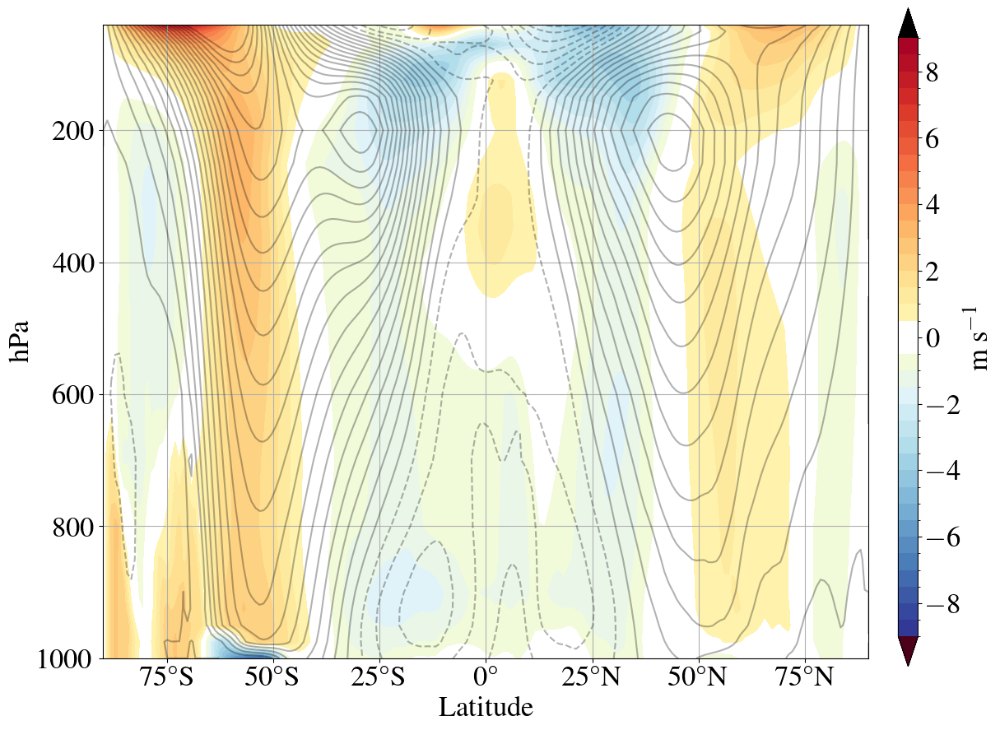

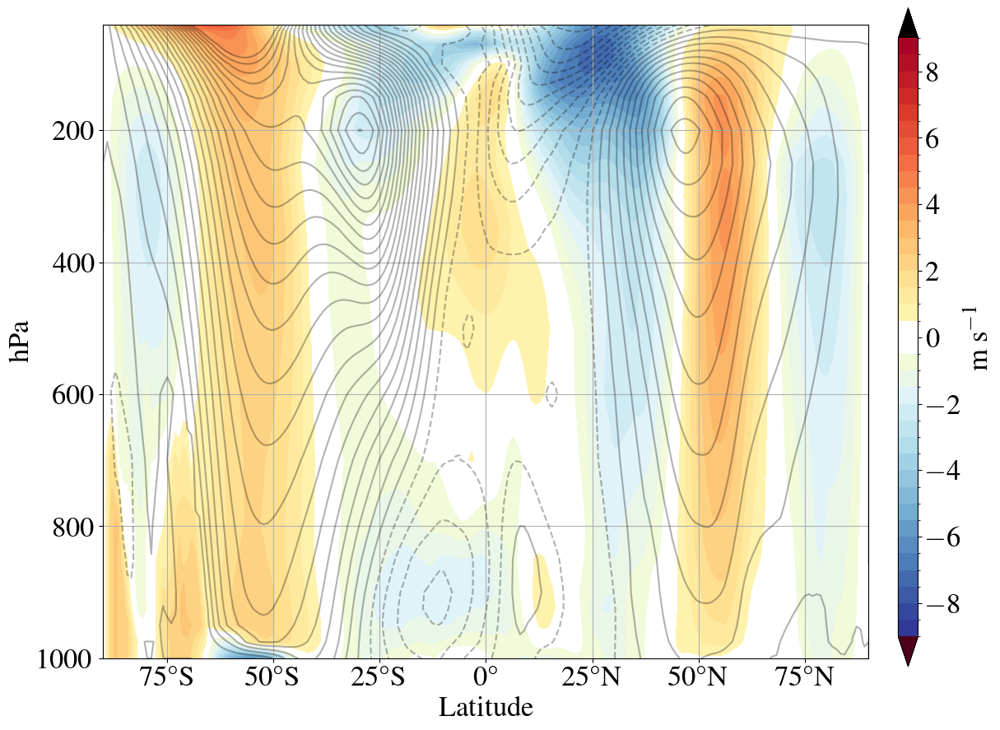

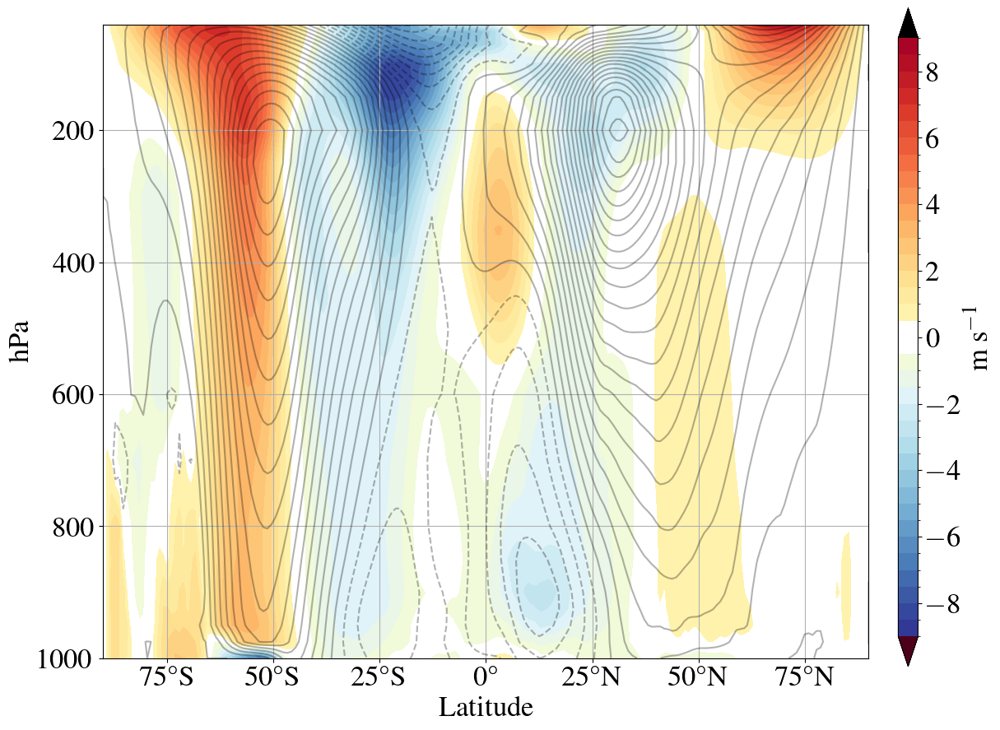

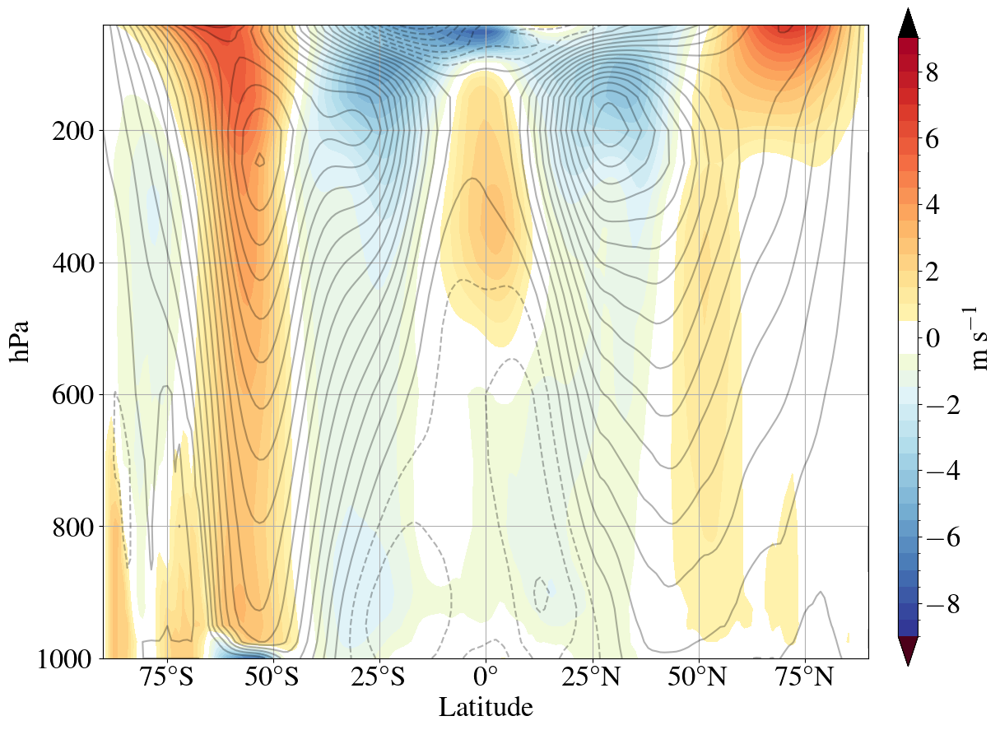

In [43]:
SEA = 'SON'

for SEA in ['SON','JJA','DJF','MAM']:
    Var_cam = 'U'
    Var_era = 'u'
    # define the colormap
    cmap = plt.cm.RdYlBu_r
    # extract all colors from the Reds map
    cmaplist = [cmap(i) for i in range(cmap.N)]
    # make the first color entry to be whhite
    cmaplist[0] = cmap(1)
    # make the last color entry to be most extreme--
    cmaplist[cmap.N-1] = cmap(0.99)

    for ii in range(120,136):
        cmaplist[ii]=[1,1,1,1]

    cmap.N
    # create the new map
    cmap = cmap.from_list('My cmap', cmaplist, cmap.N)
    clevels = np.arange(-9,9.5,0.5)
    contlevels = np.arange(-40,42,2)
    norm = mpl.colors.BoundaryNorm(clevels, cmap.N)
    cmap.set_under([0.3, 0.00, 0.1, 1.0])
    cmap.set_over('k')
    #plotting:
    plotter=(ds_weighted.sel(season=SEA,lev=slice(10,1200))[Var_cam] - ERAi_weighted.sel(season=SEA,lev=slice(10,1200))[Var_era]).squeeze().mean('lon')
    # plotter= ds_weighted.sel(season=SEA,lev=slice(10,1200))['Nudge_U'].mean('lon')*21600
    plotterC= ds_weighted.sel(season=SEA,lev=slice(10,1200))[Var_cam].mean('lon')


    lat = ds_weighted['lat']
    plevv = ds_weighted['lev'].sel(lev=slice(10,1200))

    fig, ax = plt.subplots(figsize=(12, 10))
    ff=plt.contourf(lat,plevv,plotter,levels=clevels,cmap=cmap,norm=norm,extend='both')
    plt.contour(lat,plevv,plotterC,levels=contlevels,colors='k',alpha=0.3)

    plt.grid(True)
    plt.ylim([40,1000])
    #     row.invert_yaxis()
    plt.xlabel('Latitude',fontsize=25)
    plt.ylabel('hPa',fontsize=25)
    lat_formatter = LatitudeFormatter(number_format='.0f')
    plt.tick_params(labelsize=25) 
    ax.invert_yaxis()
    ax.xaxis.set_major_formatter(lat_formatter)

    # create the colorbar
    ax2 = fig.add_axes([0.93, 0.1, 0.02, 0.8])
    cb = mpl.colorbar.ColorbarBase(ax2, cmap=cmap, norm=norm, extend='both', spacing='proportional', ticks=clevels, boundaries=clevels)
    ax2.set_ylabel('m s$^{-1}$', size=25)
    cb.ax.tick_params(labelsize=25)
    tick_locator = ticker.MaxNLocator(nbins=10)
    cb.locator = tick_locator
    cb.update_ticks()

    ### +++ saving
    filepath = '/glade/work/wchapman/DA_ML/notebooks/Figures/Figure_output/'
    plt.savefig(filepath +'/U_free_Vertical_structure_'+SEA+'.png', dpi=200,bbox_inches='tight')
    ### --- saving


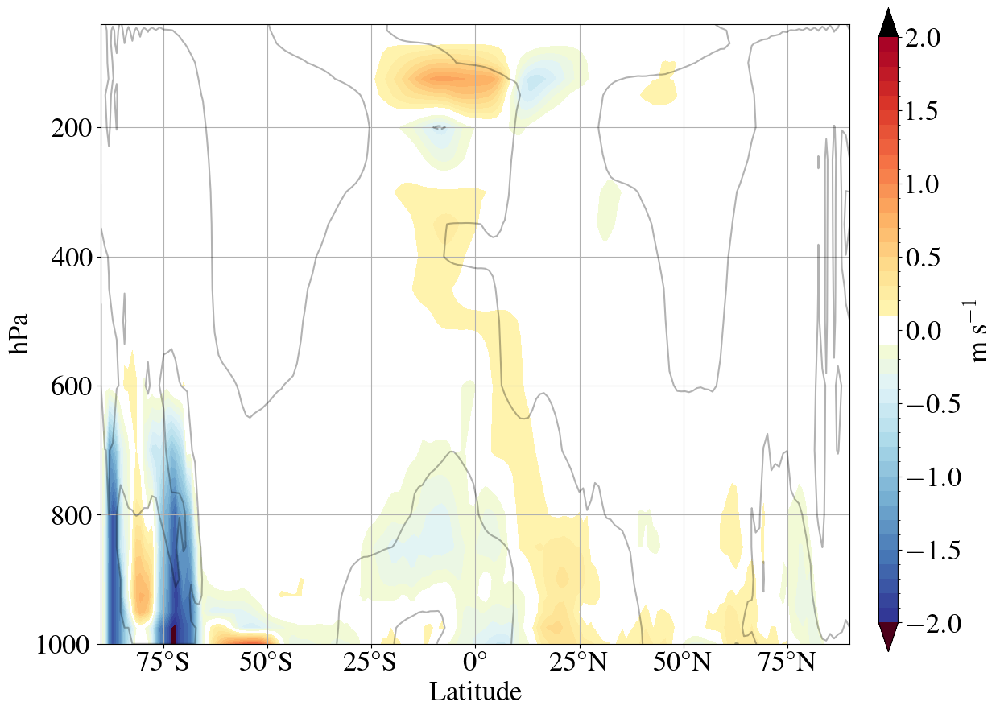

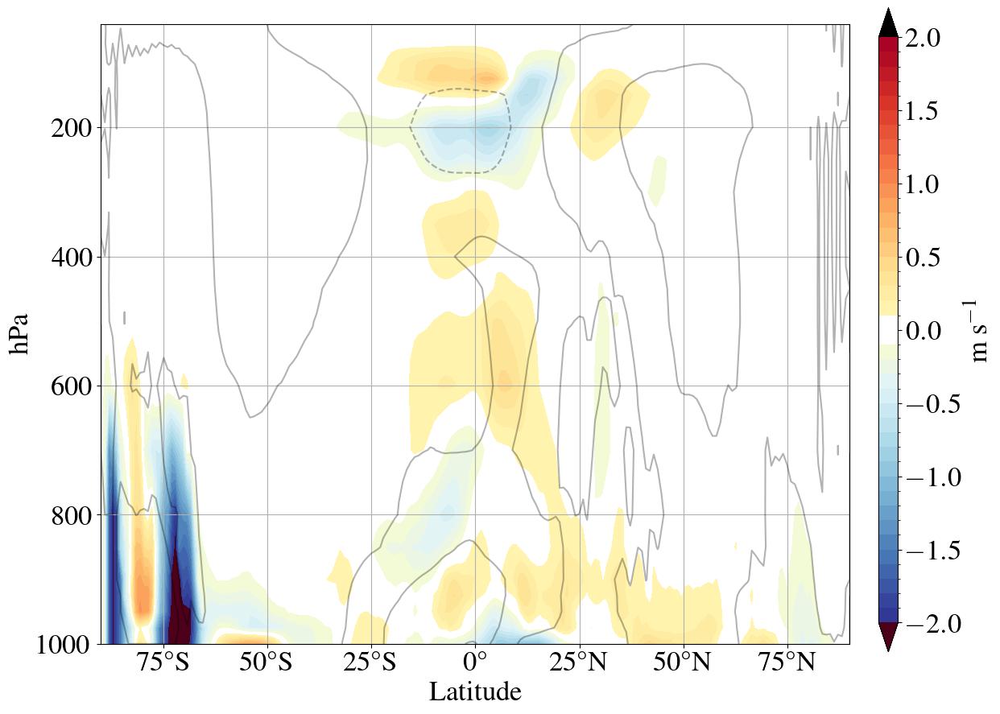

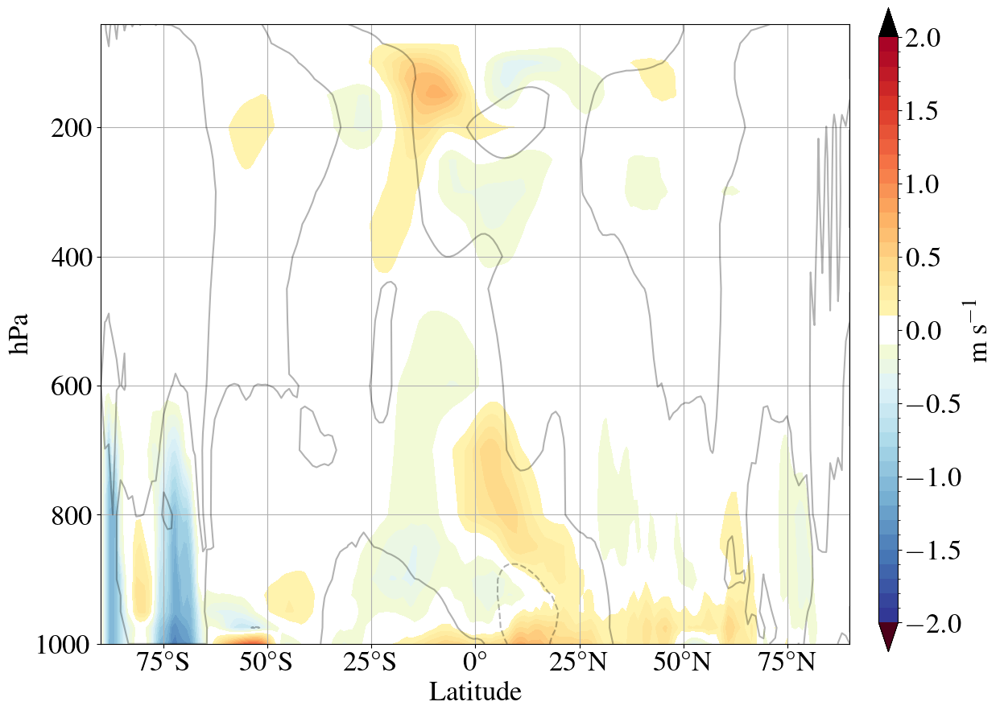

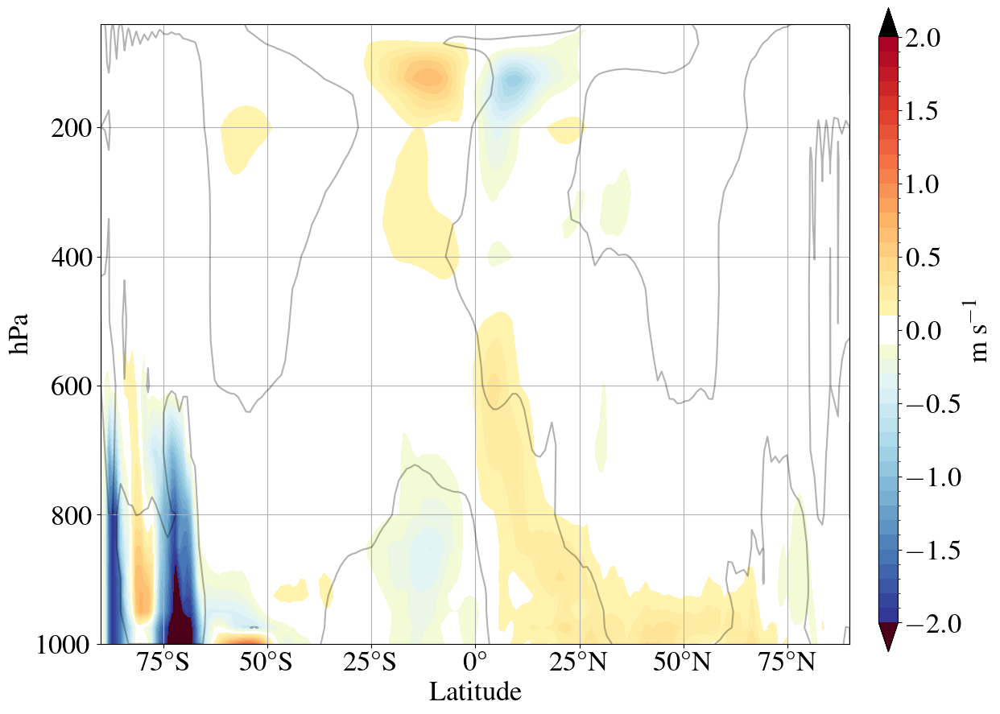

In [44]:
for SEA in ['SON','JJA','DJF','MAM']:
    Var_cam = 'V'
    Var_era = 'v'
    # define the colormap
    cmap = plt.cm.RdYlBu_r
    # extract all colors from the Reds map
    cmaplist = [cmap(i) for i in range(cmap.N)]
    # make the first color entry to be whhite
    cmaplist[0] = cmap(1)
    # make the last color entry to be most extreme--
    cmaplist[cmap.N-1] = cmap(0.99)

    for ii in range(120,136):
        cmaplist[ii]=[1,1,1,1]

    cmap.N
    # create the new map
    cmap = cmap.from_list('My cmap', cmaplist, cmap.N)
    clevels = np.arange(-2,2.1,0.1)
    contlevels = np.arange(-40,42,2)
    norm = mpl.colors.BoundaryNorm(clevels, cmap.N)
    cmap.set_under([0.3, 0.00, 0.1, 1.0])
    cmap.set_over('k')
    #plotting:
    plotter=(ds_weighted.sel(season=SEA,lev=slice(10,1200))[Var_cam] - ERAi_weighted.sel(season=SEA,lev=slice(10,1200))[Var_era]).squeeze().mean('lon')
    # plotter= ds_weighted.sel(season=SEA,lev=slice(10,1200))['Nudge_U'].mean('lon')*21600
    plotterC= ds_weighted.sel(season=SEA,lev=slice(10,1200))[Var_cam].mean('lon')


    lat = ds_weighted['lat']
    plevv = ds_weighted['lev'].sel(lev=slice(10,1200))

    fig, ax = plt.subplots(figsize=(12, 10))
    ff=plt.contourf(lat,plevv,plotter,levels=clevels,cmap=cmap,norm=norm,extend='both')
    plt.contour(lat,plevv,plotterC,levels=contlevels,colors='k',alpha=0.3)

    plt.grid(True)
    plt.ylim([40,1000])
    #     row.invert_yaxis()
    plt.xlabel('Latitude',fontsize=25)
    plt.ylabel('hPa',fontsize=25)
    lat_formatter = LatitudeFormatter(number_format='.0f')
    plt.tick_params(labelsize=25) 
    ax.invert_yaxis()
    ax.xaxis.set_major_formatter(lat_formatter)

    # create the colorbar
    ax2 = fig.add_axes([0.93, 0.1, 0.02, 0.8])
    cb = mpl.colorbar.ColorbarBase(ax2, cmap=cmap, norm=norm, extend='both', spacing='proportional', ticks=clevels, boundaries=clevels)
    ax2.set_ylabel('m s$^{-1}$', size=25)
    cb.ax.tick_params(labelsize=25)
    tick_locator = ticker.MaxNLocator(nbins=10)
    cb.locator = tick_locator
    cb.update_ticks()
    ### +++ saving
    filepath = '/glade/work/wchapman/DA_ML/notebooks/Figures/Figure_output/'
    plt.savefig(filepath +'/V_free_Vertical_structure_'+SEA+'.png', dpi=200,bbox_inches='tight')
    ### --- saving

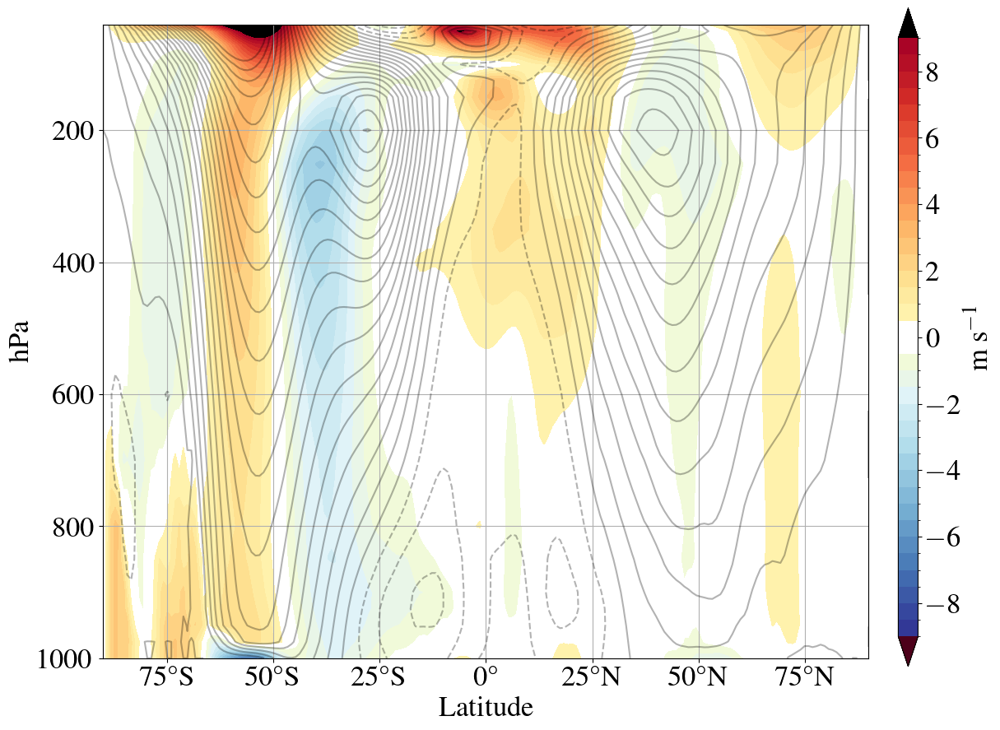

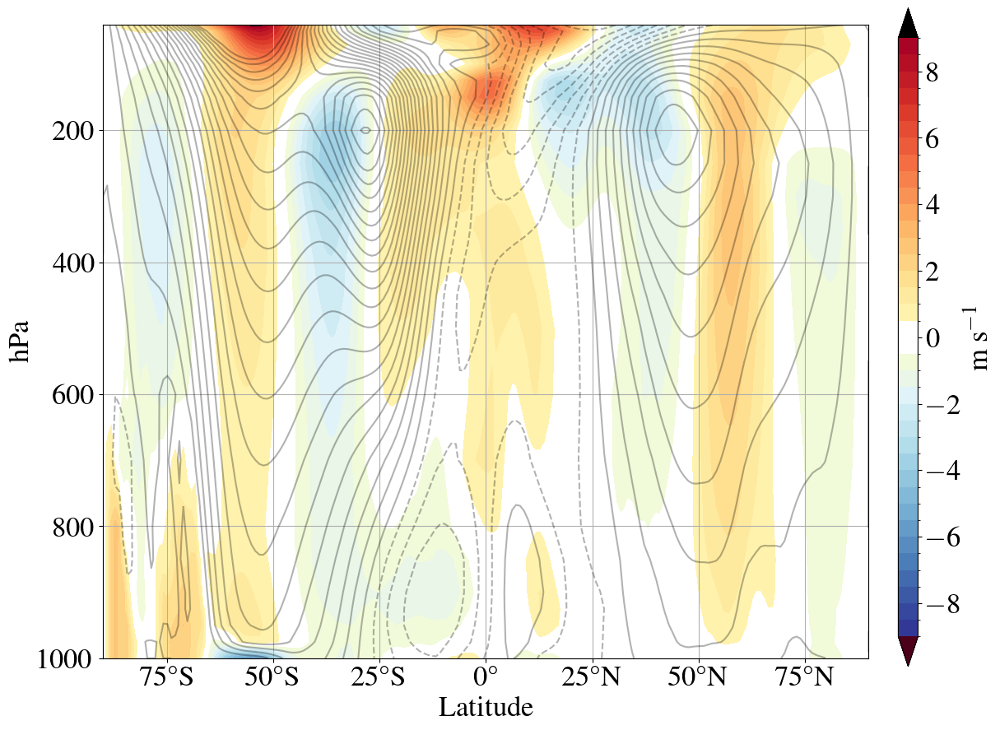

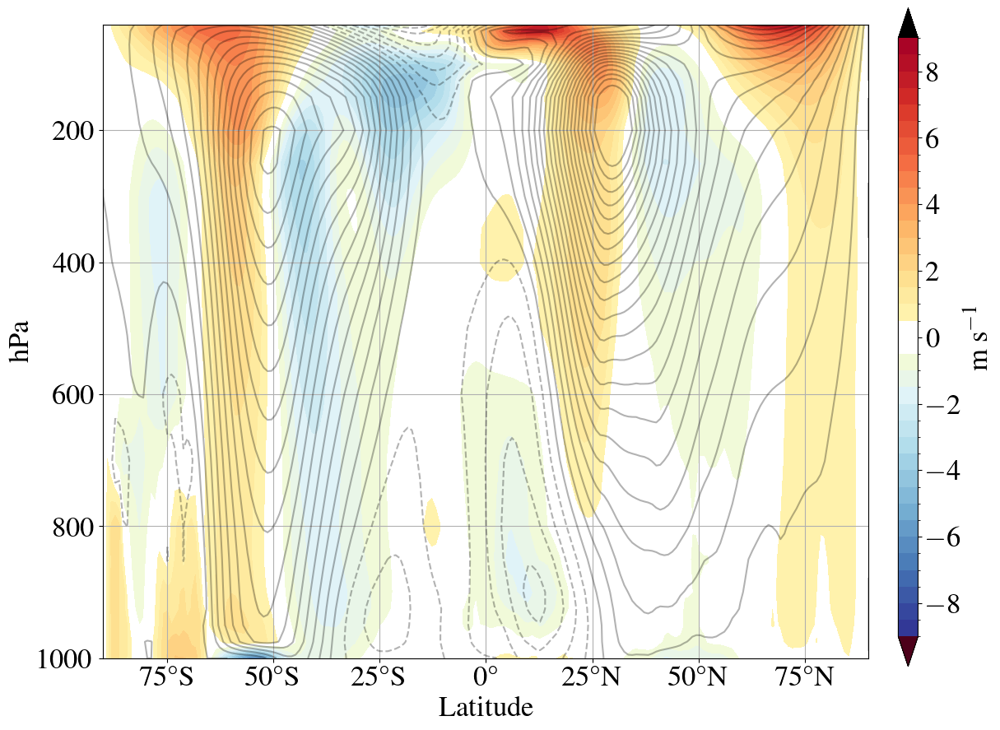

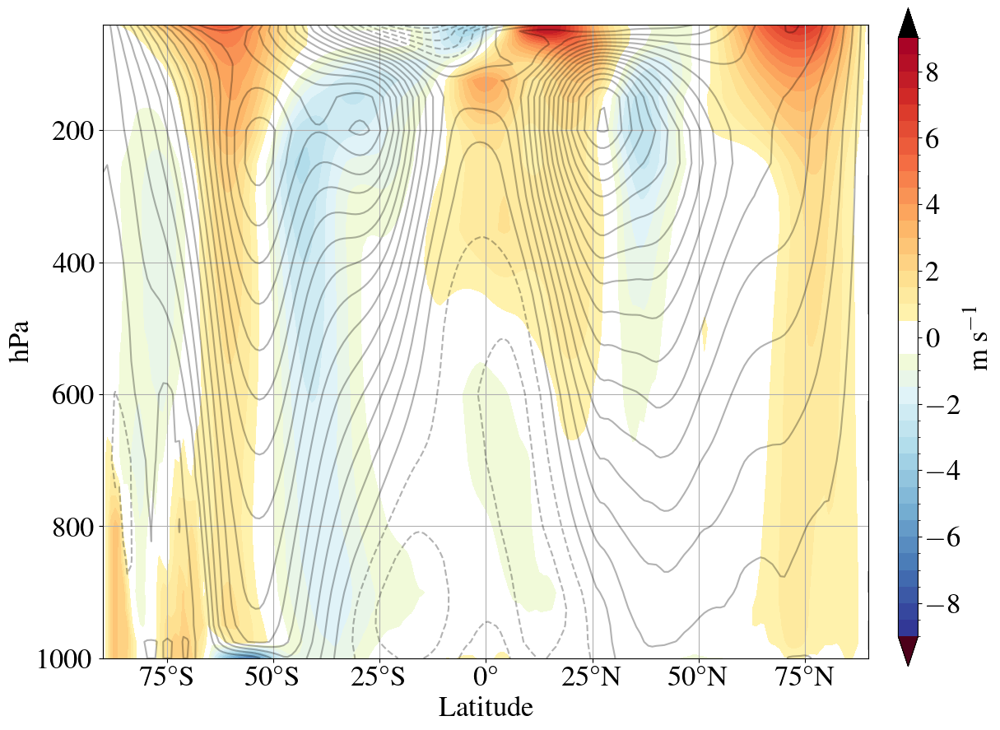

In [45]:
for SEA in ['SON','JJA','DJF','MAM']:
    Var_cam = 'U'
    Var_era = 'u'
    # define the colormap
    cmap = plt.cm.RdYlBu_r
    # extract all colors from the Reds map
    cmaplist = [cmap(i) for i in range(cmap.N)]
    # make the first color entry to be whhite
    cmaplist[0] = cmap(1)
    # make the last color entry to be most extreme--
    cmaplist[cmap.N-1] = cmap(0.99)

    for ii in range(120,136):
        cmaplist[ii]=[1,1,1,1]

    cmap.N
    # create the new map
    cmap = cmap.from_list('My cmap', cmaplist, cmap.N)
    clevels = np.arange(-9,9.5,0.5)
    contlevels = np.arange(-40,42,2)
    norm = mpl.colors.BoundaryNorm(clevels, cmap.N)
    cmap.set_under([0.3, 0.00, 0.1, 1.0])
    cmap.set_over('k')
    #plotting:
    plotter=(ds_weighted_05.sel(season=SEA,lev=slice(10,1200))[Var_cam] - ERAi_weighted.sel(season=SEA,lev=slice(10,1200))[Var_era]).squeeze().mean('lon')
    # plotter= ds_weighted.sel(season=SEA,lev=slice(10,1200))['Nudge_U'].mean('lon')*21600
    plotterC= ds_weighted_05.sel(season=SEA,lev=slice(10,1200))[Var_cam].mean('lon')


    lat = ds_weighted_05['lat']
    plevv = ds_weighted_05['lev'].sel(lev=slice(10,1200))

    fig, ax = plt.subplots(figsize=(12, 10))
    ff=plt.contourf(lat,plevv,plotter,levels=clevels,cmap=cmap,norm=norm,extend='both')
    plt.contour(lat,plevv,plotterC,levels=contlevels,colors='k',alpha=0.3)

    plt.grid(True)
    plt.ylim([40,1000])
    #     row.invert_yaxis()
    plt.xlabel('Latitude',fontsize=25)
    plt.ylabel('hPa',fontsize=25)
    lat_formatter = LatitudeFormatter(number_format='.0f')
    plt.tick_params(labelsize=25) 
    ax.invert_yaxis()
    ax.xaxis.set_major_formatter(lat_formatter)

    # create the colorbar
    ax2 = fig.add_axes([0.93, 0.1, 0.02, 0.8])
    cb = mpl.colorbar.ColorbarBase(ax2, cmap=cmap, norm=norm, extend='both', spacing='proportional', ticks=clevels, boundaries=clevels)
    ax2.set_ylabel('m s$^{-1}$', size=25)
    cb.ax.tick_params(labelsize=25)
    tick_locator = ticker.MaxNLocator(nbins=10)
    cb.locator = tick_locator
    cb.update_ticks()


    ### +++ saving
    filepath = '/glade/work/wchapman/DA_ML/notebooks/Figures/Figure_output/'
    plt.savefig(filepath +'/U_'+modvers+'_Vertical_structure_'+SEA+'.png', dpi=200,bbox_inches='tight')
    ### --- saving


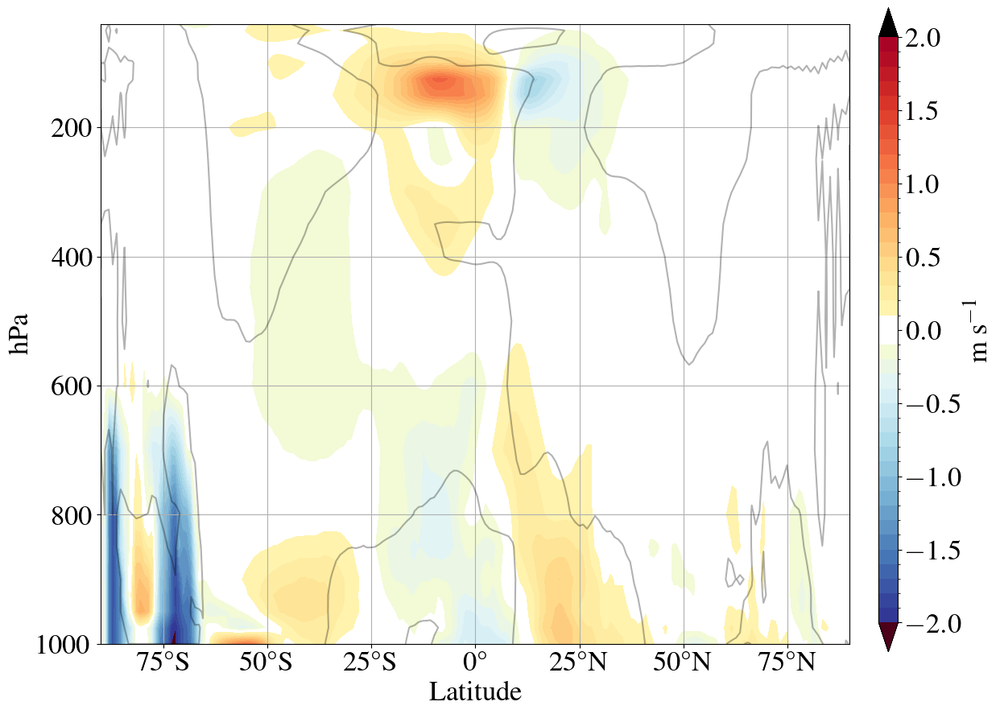

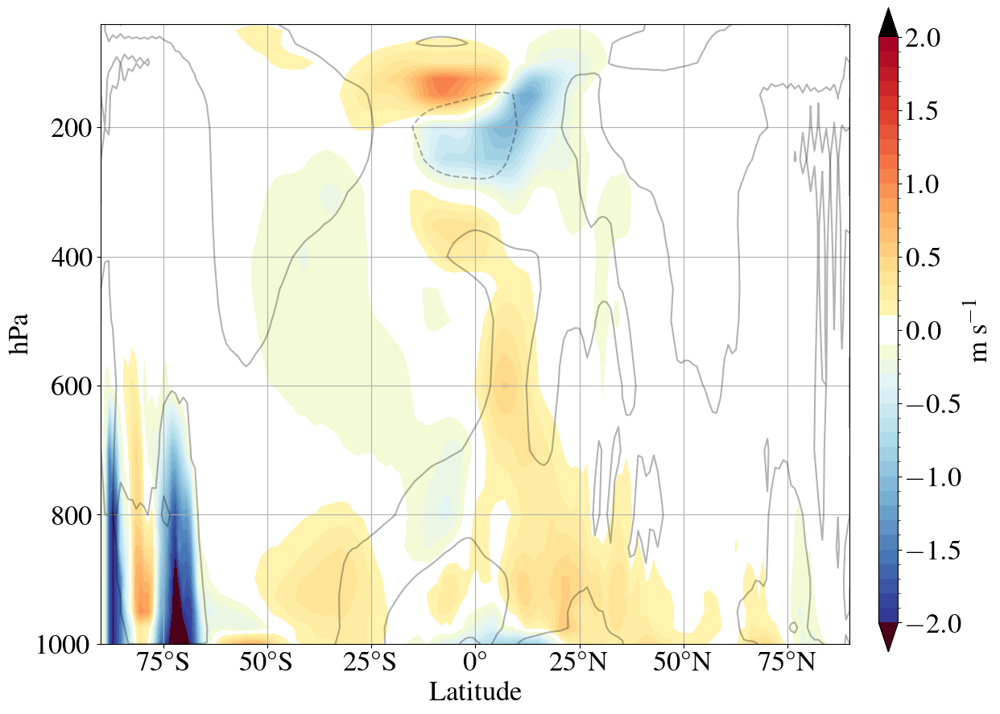

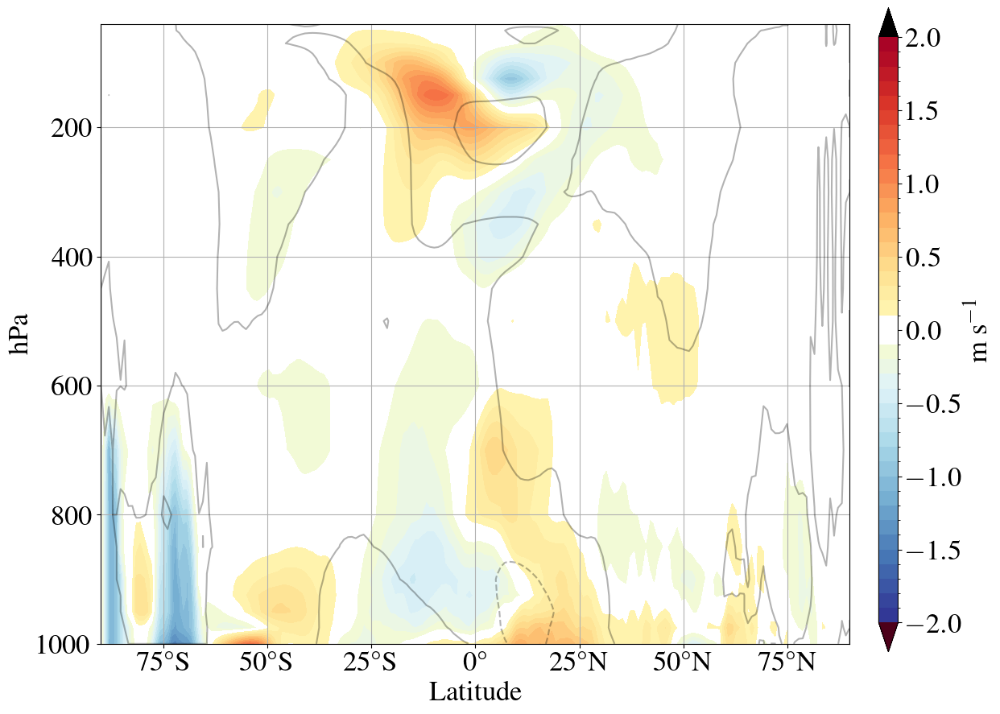

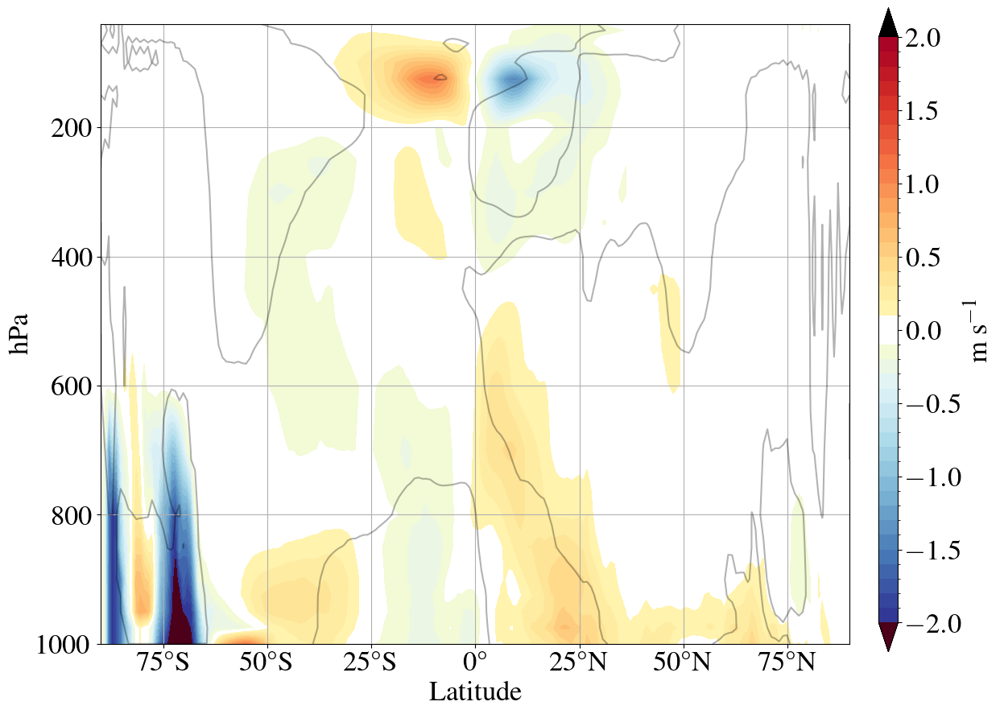

In [46]:
for SEA in ['SON','JJA','DJF','MAM']:
    Var_cam = 'V'
    Var_era = 'v'
    # define the colormap
    cmap = plt.cm.RdYlBu_r
    # extract all colors from the Reds map
    cmaplist = [cmap(i) for i in range(cmap.N)]
    # make the first color entry to be whhite
    cmaplist[0] = cmap(1)
    # make the last color entry to be most extreme--
    cmaplist[cmap.N-1] = cmap(0.99)

    for ii in range(120,136):
        cmaplist[ii]=[1,1,1,1]

    cmap.N
    # create the new map
    cmap = cmap.from_list('My cmap', cmaplist, cmap.N)
    clevels = np.arange(-2,2.1,0.1)
    contlevels = np.arange(-40,42,2)
    norm = mpl.colors.BoundaryNorm(clevels, cmap.N)
    cmap.set_under([0.3, 0.00, 0.1, 1.0])
    cmap.set_over('k')
    #plotting:
    plotter=(ds_weighted_05.sel(season=SEA,lev=slice(10,1200))[Var_cam] - ERAi_weighted.sel(season=SEA,lev=slice(10,1200))[Var_era]).squeeze().mean('lon')
    # plotter= ds_weighted.sel(season=SEA,lev=slice(10,1200))['Nudge_U'].mean('lon')*21600
    plotterC= ds_weighted_05.sel(season=SEA,lev=slice(10,1200))[Var_cam].mean('lon')


    lat = ds_weighted_05['lat']
    plevv = ds_weighted_05['lev'].sel(lev=slice(10,1200))

    fig, ax = plt.subplots(figsize=(12, 10))
    ff=plt.contourf(lat,plevv,plotter,levels=clevels,cmap=cmap,norm=norm,extend='both')
    plt.contour(lat,plevv,plotterC,levels=contlevels,colors='k',alpha=0.3)

    plt.grid(True)
    plt.ylim([40,1000])
    #     row.invert_yaxis()
    plt.xlabel('Latitude',fontsize=25)
    plt.ylabel('hPa',fontsize=25)
    lat_formatter = LatitudeFormatter(number_format='.0f')
    plt.tick_params(labelsize=25) 
    ax.invert_yaxis()
    ax.xaxis.set_major_formatter(lat_formatter)

    # create the colorbar
    ax2 = fig.add_axes([0.93, 0.1, 0.02, 0.8])
    cb = mpl.colorbar.ColorbarBase(ax2, cmap=cmap, norm=norm, extend='both', spacing='proportional', ticks=clevels, boundaries=clevels)
    ax2.set_ylabel('m s$^{-1}$', size=25)
    cb.ax.tick_params(labelsize=25)
    tick_locator = ticker.MaxNLocator(nbins=10)
    cb.locator = tick_locator
    cb.update_ticks()
    ### +++ saving
    filepath = '/glade/work/wchapman/DA_ML/notebooks/Figures/Figure_output/'
    plt.savefig(filepath +'/V_'+modvers+'_Vertical_structure_'+SEA+'.png', dpi=200,bbox_inches='tight')
    ### --- saving


## Four Panel

free: 1.48


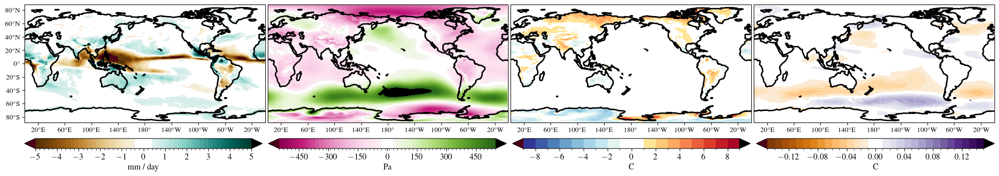

free: 1.83


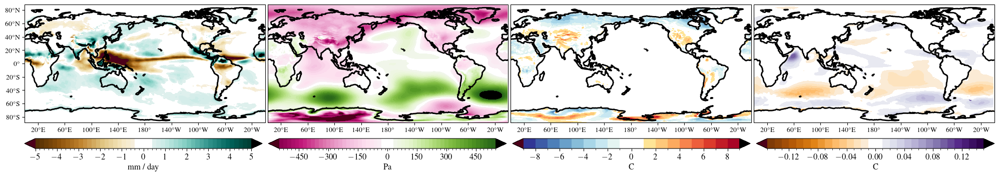

free: 2.31


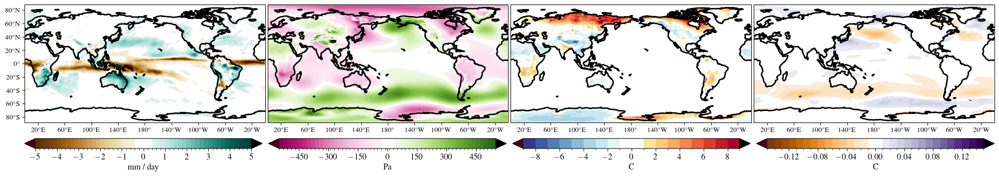

free: 1.73


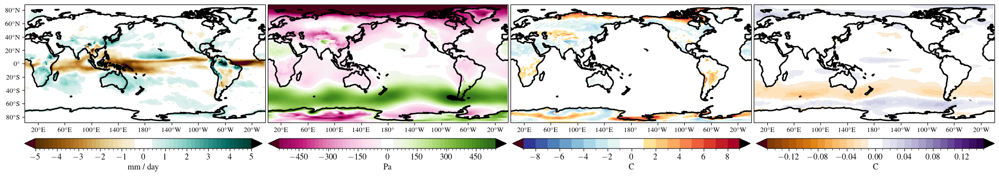

In [47]:
SEA = 'DJF'
levdo = 850
plotter_scaling=1
for SEA in ['SON','JJA','DJF','MAM']:
    fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(25,20),sharex=True,subplot_kw={'projection': ccrs.PlateCarree(central_longitude=180)})
    ax = ax.ravel()
    modl = ['PRECT', 'PSL', 'TREFHT', 'tau_nox']
    obs = ['tp','msl','t2m','ewss']
    #area weighting 
    weights = np.cos(np.deg2rad(ds_weighted.lat))
    weights.name = "weights"

    for nummy,ax1 in reversed(list(enumerate(ax))):
        Vary = modl[nummy]
        Vary_obs = obs[nummy]
        lat = ds_weighted.lat
        lon = ds_weighted.lon

        if Vary == 'PRECT':
            plotter_scaling = 1
            DSh1=ERAi_weighted
            plotter = DSh1[Vary_obs].sel(season=SEA).sel(method='nearest')
            plotter = plotter.where(landmask.LANDFRAC<=0.1,np.nan).squeeze()
            plotter_obs = plotter

            clevels=(np.arange(-5,5.2,.2))
            ### +++ define the colormap
            cmap = plt.cm.BrBG
            # extract all colors from the Reds map
            cmaplist = [cmap(i) for i in range(cmap.N)]
            # make the first color entry to be whhite
            cmaplist[0] = cmap(0)
            # make the last color entry to be most extreme--
            cmaplist[cmap.N-1] = cmap(0.99)
            for ii in range(115,137):
                cmaplist[ii]=[1,1,1,1]
            # create the new map
            cmap = cmap.from_list('My cmap', cmaplist, cmap.N)
            # define the contour levels and normalize
            # clevels = [1,26,50, 90, 120, 150,195, 300,330,350,400,450,500]
            norm = mpl.colors.BoundaryNorm(clevels, cmap.N)
            ## --- define the colormap

            plotter=(ds_weighted_05.sel(season=SEA,lev=levdo)[Vary]*86400*1000 - ERAi_weighted.sel(season=SEA,lev=levdo)[Vary_obs]*1000).squeeze() * plotter_scaling


        if Vary == 'TREFHT':
            DSh1=ERAi_weighted
            plotter = DSh1[Vary_obs].sel(season=SEA)
            plotter = plotter.where(landmask.LANDFRAC>=0.9999,np.nan).squeeze()
            plotter_obs = plotter 

            DSh1=ds_weighted_05
            plotter = DSh1[Vary].sel(season=SEA)
            plotter = plotter.where(landmask.LANDFRAC>=0.9999,np.nan).squeeze()
            plotter_free = plotter
            print('free:',np.round(wgt_rmse(plotter_obs,plotter,weights),2))  
            plotter = plotter_free-plotter_obs


            plotter = plotter_free-plotter_obs

            # define the colormap
            cmap = plt.cm.RdYlBu_r
            # extract all colors from the Reds map
            cmaplist = [cmap(i) for i in range(cmap.N)]
            # make the first color entry to be whhite
            cmaplist[0] = cmap(0)
            # make the last color entry to be most extreme--
            cmaplist[cmap.N-1] = cmap(0.99)
            for ii in range(120,136):
                cmaplist[ii]=[1,1,1,1]
            # create the new map
            cmap = cmap.from_list('My cmap', cmaplist, cmap.N)
            # define the contour levels and normalize
            clevels=(np.arange(-9,10,1))
            norm = mpl.colors.BoundaryNorm(clevels, cmap.N)


        if Vary == 'tau_nox':

            # define the colormap
            cmap = plt.cm.PuOr
            # extract all colors from the Reds map
            cmaplist = [cmap(i) for i in range(cmap.N)]
            # make the first color entry to be whhite
            cmaplist[0] = cmap(0)
            # make the last color entry to be most extreme--
            cmaplist[cmap.N-1] = cmap(0.99)
            for ii in range(120,136):
                cmaplist[ii]=[1,1,1,1]
            # create the new map
            cmap = cmap.from_list('My cmap', cmaplist, cmap.N)
            # define the contour levels and normalize
            clevels = [1,26,50, 90, 120, 150,195, 300,330,350,400,450,500]
            clevels=(np.arange(-0.15,.16,0.01))
            norm = mpl.colors.BoundaryNorm(clevels, cmap.N)

            DSh1=ERAi_weighted
            plotter = DSh1[Vary_obs].sel(season=SEA)/100000
            plotter = plotter.where(landmask.LANDFRAC<=0.1,np.nan).squeeze()
            plotter_era = plotter
            # print('free:',np.round(wgt_rmse(np.array(plotter_obs),np.array(plotter),weights),4))
            plotter = plotter_era 

            DSh1=ds_weighted_05
            plotter = DSh1[Vary].sel(season=SEA)
            plotter = plotter.where(landmask.LANDFRAC<=0.1,np.nan).squeeze()
            plotter_stoch = plotter
            # print('stoch:',np.round(wgt_rmse(np.array(plotter_obs),np.array(plotter),weights),4))
            plotter = plotter_stoch 

            plotter = plotter_stoch - plotter_era

        if Vary == 'PSL':
            clevels=(np.arange(-550,570,20))

            ## +++ define the colormap
            cmap = plt.cm.PiYG
            # extract all colors from the Reds map
            cmaplist = [cmap(i) for i in range(cmap.N)]
            # make the first color entry to be whhite
            cmaplist[0] = cmap(0)
            # make the last color entry to be most extreme--
            cmaplist[cmap.N-1] = cmap(0.99)
            for ii in range(120,136):
                cmaplist[ii]=[1,1,1,1]
            # create the new map
            cmap = cmap.from_list('My cmap', cmaplist, cmap.N)
            # define the contour levels and normalize
            # clevels = [1,26,50, 90, 120, 150,195, 300,330,350,400,450,500]
            norm = mpl.colors.BoundaryNorm(clevels, cmap.N)
            ## --- define the colormap
            plotter = plotter_free - plotter_stoch
            ###---- controls

            ## +++define plotting vars: 
            plotter=(ds_weighted_05.sel(season=SEA,lev=levdo)[Vary] - ERAi_weighted.sel(season=SEA,lev=levdo)[Vary_obs]).squeeze() * plotter_scaling



        ## +++plotting functionality 
        # ax1 = ax.ravel()

        # fig = plt.figure(figsize=(30, 10))
        proj = ccrs.PlateCarree(central_longitude=180)
        # ax1 = plt.subplot(1, 1, 1, projection=proj)
        ax1.coastlines('110m',linewidth=2)
        cmap.set_over('k')
        cmap.set_under([0.3, 0.00, 0.1, 1.0])
        bb=ax1.contourf(lon-180,lat,plotter,levels=clevels,cmap=cmap,norm=norm,transform=proj,extend='both')
        # plt.contour(lon-180,lat,plotCont,levels=np.arange(100,500,50),colors='k',transform=proj)

        states_provinces = cfeature.NaturalEarthFeature(category='cultural',name='admin_1_states_provinces_lines',
                        scale='10m',
                        facecolor='none')

        ax1.set_xticks([20,60,100,140,180,220,260,300,340], crs=ccrs.PlateCarree())
        lon_formatter = LongitudeFormatter(zero_direction_label=True,number_format='.0f')
        ax1.xaxis.set_major_formatter(lon_formatter)
        ax1.tick_params(labelsize=10) 

        if Vary == 'PRECT':
            ax2 = fig.add_axes([0.125, 0.42, 0.19, 0.01])
            cb = mpl.colorbar.ColorbarBase(ax2, cmap=cmap, norm=norm, extend='both',orientation='horizontal', spacing='proportional')
            ax2.set_xlabel('mm / day', size=12)
            cb.ax.tick_params(labelsize=12)
            tick_locator = ticker.MaxNLocator(nbins=12)
            cb.locator = tick_locator
            cb.update_ticks()
            ## ---plotting functionality 

        if Vary == 'TREFHT':
            ax2 = fig.add_axes([0.125+.39, 0.42, 0.19, 0.01])
            cb = mpl.colorbar.ColorbarBase(ax2, cmap=cmap, norm=norm, extend='both',orientation='horizontal', spacing='proportional')
            ax2.set_xlabel('C', size=12)
            cb.ax.tick_params(labelsize=12)
            tick_locator = ticker.MaxNLocator(nbins=10)
            cb.locator = tick_locator
            cb.update_ticks()
            ## ---plotting functionality 

        if Vary == 'tau_nox':
            ax2 = fig.add_axes([0.125+.585, 0.42, 0.19, 0.01])
            cb = mpl.colorbar.ColorbarBase(ax2, cmap=cmap, norm=norm, extend='both',orientation='horizontal', spacing='proportional')
            ax2.set_xlabel('C', size=12)
            cb.ax.tick_params(labelsize=12)
            tick_locator = ticker.MaxNLocator(nbins=8)
            cb.locator = tick_locator
            cb.update_ticks()
            ## ---plotting functionality 

        if Vary == 'PSL':
            ax2 = fig.add_axes([0.125+.195, 0.42, 0.19, 0.01])
            cb = mpl.colorbar.ColorbarBase(ax2, cmap=cmap, norm=norm, extend='both',orientation='horizontal', spacing='proportional')
            ax2.set_xlabel('Pa', size=12)
            cb.ax.tick_params(labelsize=12)
            tick_locator = ticker.MaxNLocator(nbins=10)
            cb.locator = tick_locator
            cb.update_ticks()
            ## ---plotting functionality


        ax1.set_extent([-180, 180, -88, 88], crs=ccrs.PlateCarree())


    ax1.set_yticks(np.arange(-80,90,20), crs=ccrs.PlateCarree())
    lon_formatter = LongitudeFormatter(zero_direction_label=True,number_format='.0f')
    ax1.yaxis.set_major_formatter(lat_formatter)
    fig.subplots_adjust(bottom=0.13,wspace=0.01)
    filepath = '/glade/work/wchapman/DA_ML/notebooks/Figures/Figure_output/'
    plt.savefig(filepath +'/4Panel_Bias_'+modvers+'_'+SEA+'.png', dpi=200,bbox_inches='tight')
    plt.show()

free: 0.0602
stoch: 0.07
free: 1.81


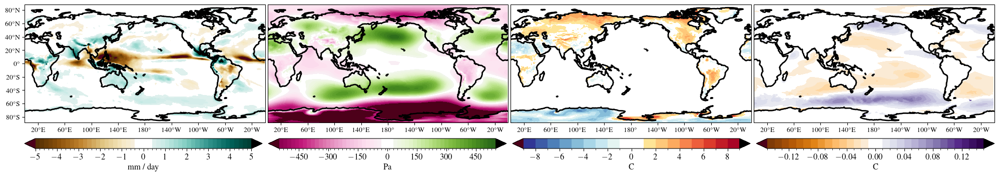

free: 0.063
stoch: 0.0749
free: 2.07


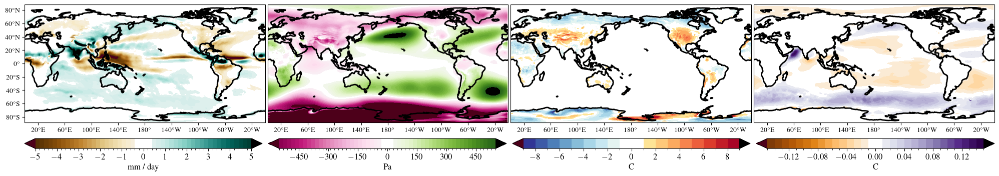

free: 0.0573
stoch: 0.0666
free: 2.52


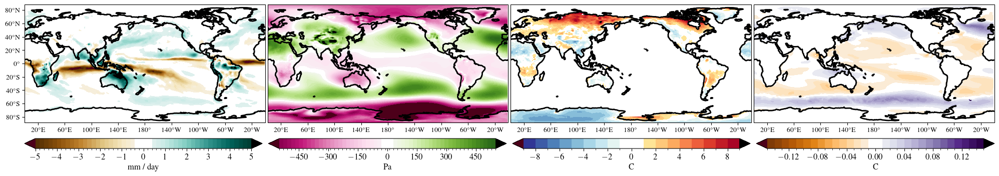

free: 0.0573
stoch: 0.067
free: 1.79


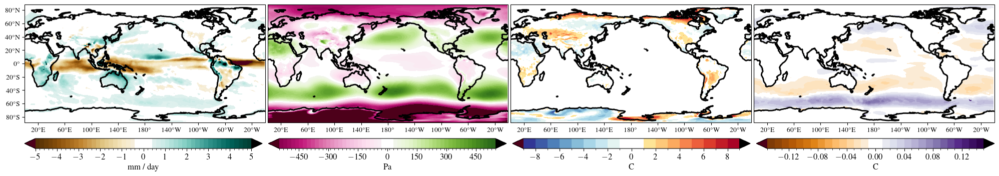

In [48]:
SEA = 'DJF'
levdo = 850
modvers_free = 'f.e21.DAcompset.f09_d025_free_MJO_1982'
for SEA in ['SON','JJA','DJF','MAM']:

    fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(25,20),sharex=True,subplot_kw={'projection': ccrs.PlateCarree(central_longitude=180)})
    ax = ax.ravel()
    modl = ['PRECT', 'PSL', 'TREFHT', 'tau_nox']
    obs = ['tp','msl','t2m','ewss']
    #area weighting 
    weights = np.cos(np.deg2rad(ds_weighted.lat))
    weights.name = "weights"

    for nummy,ax1 in reversed(list(enumerate(ax))):
        Vary = modl[nummy]
        Vary_obs = obs[nummy]
        lat = ds_weighted.lat
        lon = ds_weighted.lon

        if Vary == 'PRECT':
            plotter_scaling = 1
            DSh1=ERAi_weighted
            plotter = DSh1[Vary_obs].sel(season=SEA).sel(method='nearest')
            plotter = plotter.where(landmask.LANDFRAC<=0.1,np.nan).squeeze()
            plotter_obs = plotter

            clevels=(np.arange(-5,5.2,.2))
            ### +++ define the colormap
            cmap = plt.cm.BrBG
            # extract all colors from the Reds map
            cmaplist = [cmap(i) for i in range(cmap.N)]
            # make the first color entry to be whhite
            cmaplist[0] = cmap(0)
            # make the last color entry to be most extreme--
            cmaplist[cmap.N-1] = cmap(0.99)
            for ii in range(115,137):
                cmaplist[ii]=[1,1,1,1]
            # create the new map
            cmap = cmap.from_list('My cmap', cmaplist, cmap.N)
            # define the contour levels and normalize
            # clevels = [1,26,50, 90, 120, 150,195, 300,330,350,400,450,500]
            norm = mpl.colors.BoundaryNorm(clevels, cmap.N)
            ## --- define the colormap

            plotter=(ds_weighted.sel(season=SEA,lev=levdo)[Vary]*86400*1000 - ERAi_weighted.sel(season=SEA,lev=levdo)[Vary_obs]*1000).squeeze() * plotter_scaling


        if Vary == 'TREFHT':
            DSh1=ERAi_weighted
            plotter = DSh1[Vary_obs].sel(season=SEA)
            plotter = plotter.where(landmask.LANDFRAC>=0.9999,np.nan).squeeze()
            plotter_obs = plotter 

            DSh1=ds_weighted
            plotter = DSh1[Vary].sel(season=SEA)
            plotter = plotter.where(landmask.LANDFRAC>=0.9999,np.nan).squeeze()
            plotter_free = plotter
            print('free:',np.round(wgt_rmse(plotter_obs,plotter,weights),2))  
            plotter = plotter_free-plotter_obs


            plotter = plotter_free-plotter_obs

            # define the colormap
            cmap = plt.cm.RdYlBu_r
            # extract all colors from the Reds map
            cmaplist = [cmap(i) for i in range(cmap.N)]
            # make the first color entry to be whhite
            cmaplist[0] = cmap(0)
            # make the last color entry to be most extreme--
            cmaplist[cmap.N-1] = cmap(0.99)
            for ii in range(120,136):
                cmaplist[ii]=[1,1,1,1]
            # create the new map
            cmap = cmap.from_list('My cmap', cmaplist, cmap.N)
            # define the contour levels and normalize
            clevels=(np.arange(-9,10,1))
            norm = mpl.colors.BoundaryNorm(clevels, cmap.N)


        if Vary == 'tau_nox':

            # define the colormap
            cmap = plt.cm.PuOr
            # extract all colors from the Reds map
            cmaplist = [cmap(i) for i in range(cmap.N)]
            # make the first color entry to be whhite
            cmaplist[0] = cmap(0)
            # make the last color entry to be most extreme--
            cmaplist[cmap.N-1] = cmap(0.99)
            for ii in range(120,136):
                cmaplist[ii]=[1,1,1,1]
            # create the new map
            cmap = cmap.from_list('My cmap', cmaplist, cmap.N)
            # define the contour levels and normalize
            clevels = [1,26,50, 90, 120, 150,195, 300,330,350,400,450,500]
            clevels=(np.arange(-0.15,.16,0.01))
            norm = mpl.colors.BoundaryNorm(clevels, cmap.N)

            DSh1=ERAi_weighted
            plotter = DSh1[Vary_obs].sel(season=SEA)/100000
            plotter = plotter.where(landmask.LANDFRAC<=0.1,np.nan).squeeze()
            plotter_era = plotter
            print('free:',np.round(wgt_rmse(np.array(plotter_obs),np.array(plotter),weights),4))
            plotter = plotter_era 

            DSh1=ds_weighted
            plotter = DSh1[Vary].sel(season=SEA)
            plotter = plotter.where(landmask.LANDFRAC<=0.1,np.nan).squeeze()
            plotter_stoch = plotter
            print('stoch:',np.round(wgt_rmse(np.array(plotter_obs),np.array(plotter),weights),4))
            plotter = plotter_stoch 

            plotter = plotter_stoch - plotter_era

        if Vary == 'PSL':
            clevels=(np.arange(-550,570,20))

            ## +++ define the colormap
            cmap = plt.cm.PiYG
            # extract all colors from the Reds map
            cmaplist = [cmap(i) for i in range(cmap.N)]
            # make the first color entry to be whhite
            cmaplist[0] = cmap(0)
            # make the last color entry to be most extreme--
            cmaplist[cmap.N-1] = cmap(0.99)
            for ii in range(120,136):
                cmaplist[ii]=[1,1,1,1]
            # create the new map
            cmap = cmap.from_list('My cmap', cmaplist, cmap.N)
            # define the contour levels and normalize
            # clevels = [1,26,50, 90, 120, 150,195, 300,330,350,400,450,500]
            norm = mpl.colors.BoundaryNorm(clevels, cmap.N)
            ## --- define the colormap
            plotter = plotter_free - plotter_stoch
            ###---- controls

            ## +++define plotting vars: 
            plotter=(ds_weighted.sel(season=SEA,lev=levdo)[Vary] - ERAi_weighted.sel(season=SEA,lev=levdo)[Vary_obs]).squeeze() * plotter_scaling



        ## +++plotting functionality 
        # ax1 = ax.ravel()

        # fig = plt.figure(figsize=(30, 10))
        proj = ccrs.PlateCarree(central_longitude=180)
        # ax1 = plt.subplot(1, 1, 1, projection=proj)
        ax1.coastlines('110m',linewidth=2)
        cmap.set_over('k')
        cmap.set_under([0.3, 0.00, 0.1, 1.0])
        bb=ax1.contourf(lon-180,lat,plotter,levels=clevels,cmap=cmap,norm=norm,transform=proj,extend='both')
        # plt.contour(lon-180,lat,plotCont,levels=np.arange(100,500,50),colors='k',transform=proj)

        states_provinces = cfeature.NaturalEarthFeature(category='cultural',name='admin_1_states_provinces_lines',
                        scale='10m',
                        facecolor='none')

        ax1.set_xticks([20,60,100,140,180,220,260,300,340], crs=ccrs.PlateCarree())
        lon_formatter = LongitudeFormatter(zero_direction_label=True,number_format='.0f')
        ax1.xaxis.set_major_formatter(lon_formatter)
        ax1.tick_params(labelsize=10) 

        if Vary == 'PRECT':
            ax2 = fig.add_axes([0.125, 0.42, 0.19, 0.01])
            cb = mpl.colorbar.ColorbarBase(ax2, cmap=cmap, norm=norm, extend='both',orientation='horizontal', spacing='proportional')
            ax2.set_xlabel('mm / day', size=12)
            cb.ax.tick_params(labelsize=12)
            tick_locator = ticker.MaxNLocator(nbins=12)
            cb.locator = tick_locator
            cb.update_ticks()
            ## ---plotting functionality 

        if Vary == 'TREFHT':
            ax2 = fig.add_axes([0.125+.39, 0.42, 0.19, 0.01])
            cb = mpl.colorbar.ColorbarBase(ax2, cmap=cmap, norm=norm, extend='both',orientation='horizontal', spacing='proportional')
            ax2.set_xlabel('C', size=12)
            cb.ax.tick_params(labelsize=12)
            tick_locator = ticker.MaxNLocator(nbins=10)
            cb.locator = tick_locator
            cb.update_ticks()
            ## ---plotting functionality 

        if Vary == 'tau_nox':
            ax2 = fig.add_axes([0.125+.585, 0.42, 0.19, 0.01])
            cb = mpl.colorbar.ColorbarBase(ax2, cmap=cmap, norm=norm, extend='both',orientation='horizontal', spacing='proportional')
            ax2.set_xlabel('C', size=12)
            cb.ax.tick_params(labelsize=12)
            tick_locator = ticker.MaxNLocator(nbins=10)
            cb.locator = tick_locator
            cb.update_ticks()
            ## ---plotting functionality 

        if Vary == 'PSL':
            ax2 = fig.add_axes([0.125+.195, 0.42, 0.19, 0.01])
            cb = mpl.colorbar.ColorbarBase(ax2, cmap=cmap, norm=norm, extend='both',orientation='horizontal', spacing='proportional')
            ax2.set_xlabel('Pa', size=12)
            cb.ax.tick_params(labelsize=12)
            tick_locator = ticker.MaxNLocator(nbins=10)
            cb.locator = tick_locator
            cb.update_ticks()
            ## ---plotting functionality


        ax1.set_extent([-180, 180, -88, 88], crs=ccrs.PlateCarree())


    ax1.set_yticks(np.arange(-80,90,20), crs=ccrs.PlateCarree())
    lon_formatter = LongitudeFormatter(zero_direction_label=True,number_format='.0f')
    ax1.yaxis.set_major_formatter(lat_formatter)
    fig.subplots_adjust(bottom=0.13,wspace=0.01)
    filepath = '/glade/work/wchapman/DA_ML/notebooks/Figures/Figure_output/'
    plt.savefig(filepath +'/4Panel_Bias_'+modvers_free+'_'+SEA+'.png', dpi=200,bbox_inches='tight')
    plt.show()

## Three Panel

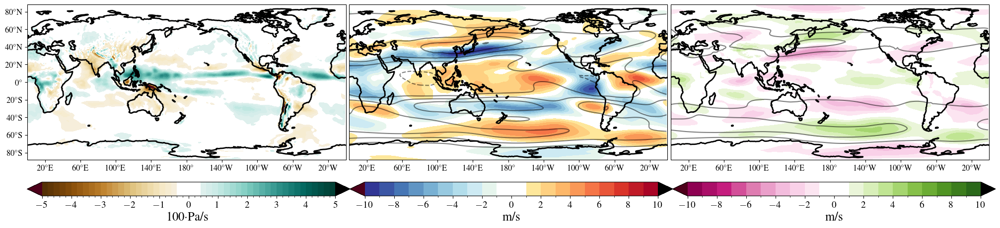

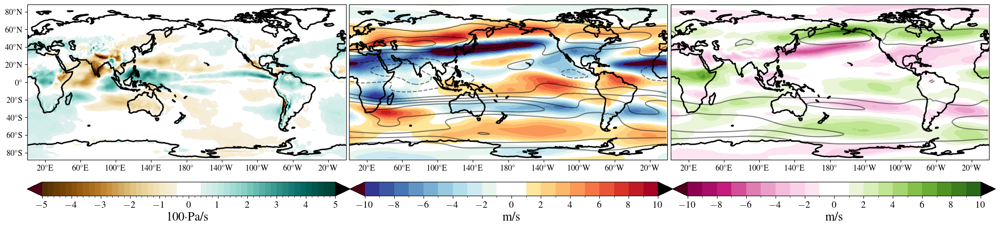

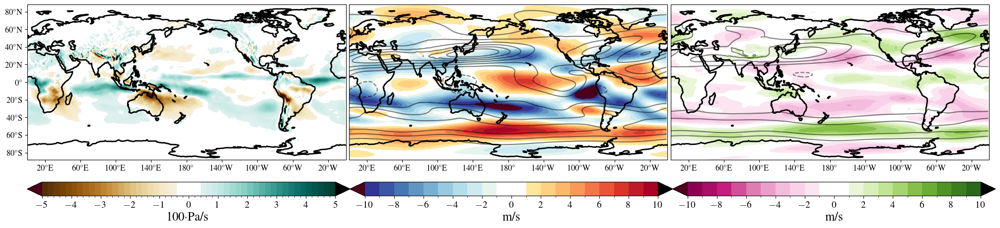

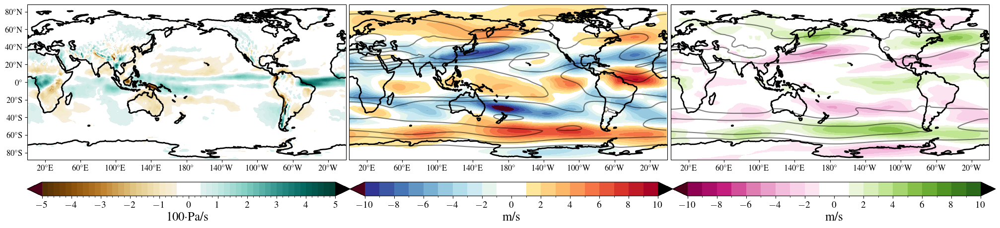

In [161]:
plotter_scaling=1
for SEA in ['SON','JJA','DJF','MAM']:
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(25,20),sharex=True,subplot_kw={'projection': ccrs.PlateCarree(central_longitude=180)})
    ax = ax.ravel()
    modl = ['OMEGA', 'U', 'U', 'U']
    obs = ['w','u','u','u']
    #area weighting 
    weights = np.cos(np.deg2rad(ds_weighted.lat))
    weights.name = "weights"

    for nummy,ax1 in reversed(list(enumerate(ax))):
        Vary = modl[nummy]
        Vary_obs = obs[nummy]
        lat = ds_weighted.lat
        lon = ds_weighted.lon

        if Vary == 'OMEGA':
            levdo=850
            plotter_scaling = 100
            DSh1=ERAi_weighted
            plotter = DSh1[Vary_obs].sel(season=SEA).sel(method='nearest')
            plotter = plotter.where(landmask.LANDFRAC<=0.1,np.nan).squeeze()
            plotter_obs = plotter

            clevels=(np.arange(-5,5.2,.2))
            ### +++ define the colormap
            cmap = plt.cm.BrBG
            # extract all colors from the Reds map
            cmaplist = [cmap(i) for i in range(cmap.N)]
            # make the first color entry to be whhite
            cmaplist[0] = cmap(0)
            # make the last color entry to be most extreme--
            cmaplist[cmap.N-1] = cmap(0.99)
            for ii in range(115,137):
                cmaplist[ii]=[1,1,1,1]
            # create the new map
            cmap = cmap.from_list('My cmap', cmaplist, cmap.N)
            # define the contour levels and normalize
            # clevels = [1,26,50, 90, 120, 150,195, 300,330,350,400,450,500]
            norm = mpl.colors.BoundaryNorm(clevels, cmap.N)
            ## --- define the colormap

            plotter=(ds_weighted_05.sel(season=SEA,lev=levdo)[Vary] - ERAi_weighted.sel(season=SEA,lev=levdo)[Vary_obs]).squeeze() * plotter_scaling

        if (Vary == 'U') & (nummy==1):
            plotter_scaling = 1
            clevels=(np.arange(-10,11,1))
            levdo=200
            ## +++ define the colormap
            cmap = plt.cm.RdYlBu_r
            # extract all colors from the Reds map
            cmaplist = [cmap(i) for i in range(cmap.N)]
            # make the first color entry to be whhite
            cmaplist[0] = cmap(0)
            # make the last color entry to be most extreme--
            cmaplist[cmap.N-1] = cmap(0.99)
            for ii in range(120,136):
                cmaplist[ii]=[1,1,1,1]
            # create the new map
            cmap = cmap.from_list('My cmap', cmaplist, cmap.N)
            # define the contour levels and normalize
            # clevels = [1,26,50, 90, 120, 150,195, 300,330,350,400,450,500]
            norm = mpl.colors.BoundaryNorm(clevels, cmap.N)
            ## --- define the colormap
            plotter = plotter_free - plotter_stoch
            ###---- controls

            ## +++define plotting vars: 
            plotter=(ds_weighted_05.sel(season=SEA,lev=levdo)[Vary] - ERAi_weighted.sel(season=SEA,lev=levdo)[Vary_obs]).squeeze() * plotter_scaling
            contlevs = [-20,-10,10,20,30,40,50,60]
            plotter_cont = ds_weighted_05.sel(season=SEA,lev=levdo)[Vary]

        if (Vary == 'U') & (nummy==2):
            plotter_scaling = 1
            clevels=(np.arange(-10,11,1))
            levdo=500
            ## +++ define the colormap
            cmap = plt.cm.PiYG
            # extract all colors from the Reds map
            cmaplist = [cmap(i) for i in range(cmap.N)]
            # make the first color entry to be whhite
            cmaplist[0] = cmap(0)
            # make the last color entry to be most extreme--
            cmaplist[cmap.N-1] = cmap(0.99)
            for ii in range(120,136):
                cmaplist[ii]=[1,1,1,1]
            # create the new map
            cmap = cmap.from_list('My cmap', cmaplist, cmap.N)
            # define the contour levels and normalize
            # clevels = [1,26,50, 90, 120, 150,195, 300,330,350,400,450,500]
            norm = mpl.colors.BoundaryNorm(clevels, cmap.N)
            ## --- define the colormap
            plotter = plotter_free - plotter_stoch
            ###---- controls

            ## +++define plotting vars: 
            plotter=(ds_weighted_05.sel(season=SEA,lev=levdo)[Vary] - ERAi_weighted.sel(season=SEA,lev=levdo)[Vary_obs]).squeeze() * plotter_scaling
            contlevs = [-20,-10,10,20,30,40,50,60]
            plotter_cont = ds_weighted_05.sel(season=SEA,lev=levdo)[Vary]


        ## +++plotting functionality 
        # ax1 = ax.ravel()

        # fig = plt.figure(figsize=(30, 10))
        proj = ccrs.PlateCarree(central_longitude=180)
        # ax1 = plt.subplot(1, 1, 1, projection=proj)
        ax1.coastlines('110m',linewidth=2)
        cmap.set_over('k')
        cmap.set_under([0.3, 0.00, 0.1, 1.0])
        bb=ax1.contourf(lon-180,lat,plotter,levels=clevels,cmap=cmap,norm=norm,transform=proj,extend='both')
        
        if Vary == 'U':
            bb=ax1.contour(lon-180,lat,plotter_cont,levels=contlevs,colors='k',alpha=0.5)
        # plt.contour(lon-180,lat,plotCont,levels=np.arange(100,500,50),colors='k',transform=proj)

        states_provinces = cfeature.NaturalEarthFeature(category='cultural',name='admin_1_states_provinces_lines',
                        scale='10m',
                        facecolor='none')

        ax1.set_xticks([20,60,100,140,180,220,260,300,340], crs=ccrs.PlateCarree())
        lon_formatter = LongitudeFormatter(zero_direction_label=True,number_format='.0f')
        ax1.xaxis.set_major_formatter(lon_formatter)
        ax1.tick_params(labelsize=12) 

        if Vary == 'OMEGA':
            ax2 = fig.add_axes([0.125, 0.39, 0.26, 0.014])
            cb = mpl.colorbar.ColorbarBase(ax2, cmap=cmap, norm=norm, extend='both',orientation='horizontal', spacing='proportional')
            ax2.set_xlabel('100$\cdot$Pa/s', size=18)
            cb.ax.tick_params(labelsize=14)
            tick_locator = ticker.MaxNLocator(nbins=12)
            cb.locator = tick_locator
            cb.update_ticks()
            ## ---plotting functionality 
            

        if (Vary == 'U') & (nummy==1):
            ax2 = fig.add_axes([0.125+.26, 0.39, 0.26, 0.014])
            cb = mpl.colorbar.ColorbarBase(ax2, cmap=cmap, norm=norm, extend='both',orientation='horizontal', spacing='proportional')
            ax2.set_xlabel('m/s', size=18)
            cb.ax.tick_params(labelsize=14)
            tick_locator = ticker.MaxNLocator(nbins=10)
            cb.locator = tick_locator
            cb.update_ticks()
            ## ---plotting functionality 

       
        if (Vary == 'U') & (nummy==2):
            ax2 = fig.add_axes([0.125+.52, 0.39, 0.26, 0.014])
            cb = mpl.colorbar.ColorbarBase(ax2, cmap=cmap, norm=norm, extend='both',orientation='horizontal', spacing='proportional')
            ax2.set_xlabel('m/s', size=18)
            cb.ax.tick_params(labelsize=14)
            tick_locator = ticker.MaxNLocator(nbins=10)
            cb.locator = tick_locator
            cb.update_ticks()
            
            ## ---plotting functionality


        ax1.set_extent([-180, 180, -88, 88], crs=ccrs.PlateCarree())

    ax1.tick_params(labelsize=12) 
    ax1.set_yticks(np.arange(-80,90,20), crs=ccrs.PlateCarree())
    lon_formatter = LongitudeFormatter(zero_direction_label=True,number_format='.0f')
    ax1.yaxis.set_major_formatter(lat_formatter)
    fig.subplots_adjust(bottom=0.13,wspace=0.01)
    filepath = '/glade/work/wchapman/DA_ML/notebooks/Figures/Figure_output/'
    plt.savefig(filepath +'/3Panel_Bias_'+modvers+'_'+SEA+'.png', dpi=200,bbox_inches='tight')
    plt.show()

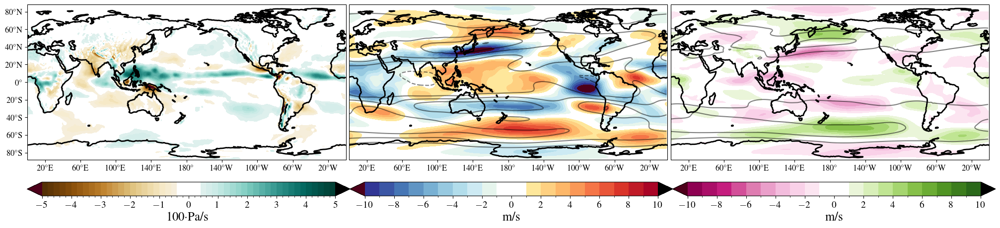

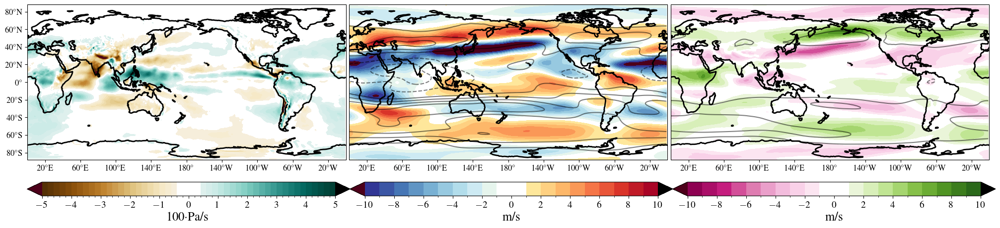

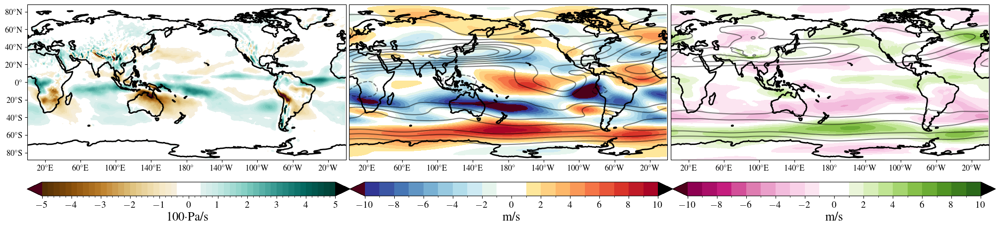

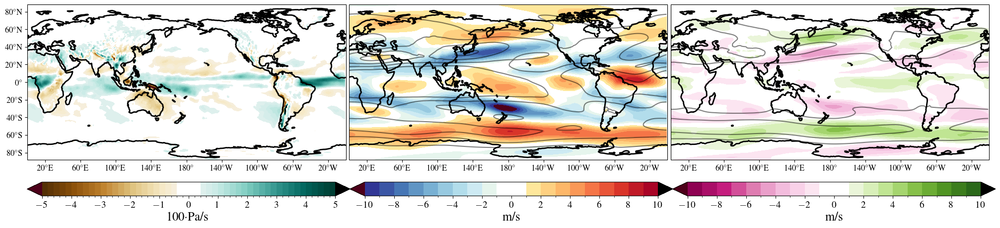

In [162]:
plotter_scaling=1
for SEA in ['SON','JJA','DJF','MAM']:
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(25,20),sharex=True,subplot_kw={'projection': ccrs.PlateCarree(central_longitude=180)})
    ax = ax.ravel()
    modl = ['OMEGA', 'U', 'U', 'U']
    obs = ['w','u','u','u']
    #area weighting 
    weights = np.cos(np.deg2rad(ds_weighted.lat))
    weights.name = "weights"

    for nummy,ax1 in reversed(list(enumerate(ax))):
        Vary = modl[nummy]
        Vary_obs = obs[nummy]
        lat = ds_weighted.lat
        lon = ds_weighted.lon

        if Vary == 'OMEGA':
            plotter_scaling = 100
            DSh1=ERAi_weighted
            plotter = DSh1[Vary_obs].sel(season=SEA).sel(method='nearest')
            plotter = plotter.where(landmask.LANDFRAC<=0.1,np.nan).squeeze()
            plotter_obs = plotter

            clevels=(np.arange(-5,5.2,.2))
            ### +++ define the colormap
            cmap = plt.cm.BrBG
            # extract all colors from the Reds map
            cmaplist = [cmap(i) for i in range(cmap.N)]
            # make the first color entry to be whhite
            cmaplist[0] = cmap(0)
            # make the last color entry to be most extreme--
            cmaplist[cmap.N-1] = cmap(0.99)
            for ii in range(115,137):
                cmaplist[ii]=[1,1,1,1]
            # create the new map
            cmap = cmap.from_list('My cmap', cmaplist, cmap.N)
            # define the contour levels and normalize
            # clevels = [1,26,50, 90, 120, 150,195, 300,330,350,400,450,500]
            norm = mpl.colors.BoundaryNorm(clevels, cmap.N)
            ## --- define the colormap

            plotter=(ds_weighted.sel(season=SEA,lev=levdo)[Vary] - ERAi_weighted.sel(season=SEA,lev=levdo)[Vary_obs]).squeeze() * plotter_scaling

        if (Vary == 'U') & (nummy==1):
            plotter_scaling = 1
            clevels=(np.arange(-10,11,1))
            levdo=200
            ## +++ define the colormap
            cmap = plt.cm.RdYlBu_r
            # extract all colors from the Reds map
            cmaplist = [cmap(i) for i in range(cmap.N)]
            # make the first color entry to be whhite
            cmaplist[0] = cmap(0)
            # make the last color entry to be most extreme--
            cmaplist[cmap.N-1] = cmap(0.99)
            for ii in range(120,136):
                cmaplist[ii]=[1,1,1,1]
            # create the new map
            cmap = cmap.from_list('My cmap', cmaplist, cmap.N)
            # define the contour levels and normalize
            # clevels = [1,26,50, 90, 120, 150,195, 300,330,350,400,450,500]
            norm = mpl.colors.BoundaryNorm(clevels, cmap.N)
            ## --- define the colormap
            plotter = plotter_free - plotter_stoch
            ###---- controls

            ## +++define plotting vars: 
            plotter=(ds_weighted.sel(season=SEA,lev=levdo)[Vary] - ERAi_weighted.sel(season=SEA,lev=levdo)[Vary_obs]).squeeze() * plotter_scaling
            contlevs = [-20,-10,10,20,30,40,50,60]
            plotter_cont = ds_weighted_05.sel(season=SEA,lev=levdo)[Vary]

        if (Vary == 'U') & (nummy==2):
            plotter_scaling = 1
            clevels=(np.arange(-10,11,1))
            levdo=500
            ## +++ define the colormap
            cmap = plt.cm.PiYG
            # extract all colors from the Reds map
            cmaplist = [cmap(i) for i in range(cmap.N)]
            # make the first color entry to be whhite
            cmaplist[0] = cmap(0)
            # make the last color entry to be most extreme--
            cmaplist[cmap.N-1] = cmap(0.99)
            for ii in range(120,136):
                cmaplist[ii]=[1,1,1,1]
            # create the new map
            cmap = cmap.from_list('My cmap', cmaplist, cmap.N)
            # define the contour levels and normalize
            # clevels = [1,26,50, 90, 120, 150,195, 300,330,350,400,450,500]
            norm = mpl.colors.BoundaryNorm(clevels, cmap.N)
            ## --- define the colormap
            plotter = plotter_free - plotter_stoch
            ###---- controls

            ## +++define plotting vars: 
            plotter=(ds_weighted.sel(season=SEA,lev=levdo)[Vary] - ERAi_weighted.sel(season=SEA,lev=levdo)[Vary_obs]).squeeze() * plotter_scaling
            contlevs = [-20,-10,10,20,30,40,50,60]
            plotter_cont = ds_weighted.sel(season=SEA,lev=levdo)[Vary]


        ## +++plotting functionality 
        # ax1 = ax.ravel()

        # fig = plt.figure(figsize=(30, 10))
        proj = ccrs.PlateCarree(central_longitude=180)
        # ax1 = plt.subplot(1, 1, 1, projection=proj)
        ax1.coastlines('110m',linewidth=2)
        cmap.set_over('k')
        cmap.set_under([0.3, 0.00, 0.1, 1.0])
        bb=ax1.contourf(lon-180,lat,plotter,levels=clevels,cmap=cmap,norm=norm,transform=proj,extend='both')
        
        if Vary == 'U':
            bb=ax1.contour(lon-180,lat,plotter_cont,levels=contlevs,colors='k',alpha=0.5)
        # plt.contour(lon-180,lat,plotCont,levels=np.arange(100,500,50),colors='k',transform=proj)

        states_provinces = cfeature.NaturalEarthFeature(category='cultural',name='admin_1_states_provinces_lines',
                        scale='10m',
                        facecolor='none')

        ax1.set_xticks([20,60,100,140,180,220,260,300,340], crs=ccrs.PlateCarree())
        lon_formatter = LongitudeFormatter(zero_direction_label=True,number_format='.0f')
        ax1.xaxis.set_major_formatter(lon_formatter)
        ax1.tick_params(labelsize=12) 

        if Vary == 'OMEGA':
            ax2 = fig.add_axes([0.125, 0.39, 0.26, 0.014])
            cb = mpl.colorbar.ColorbarBase(ax2, cmap=cmap, norm=norm, extend='both',orientation='horizontal', spacing='proportional')
            ax2.set_xlabel('100$\cdot$Pa/s', size=18)
            cb.ax.tick_params(labelsize=14)
            tick_locator = ticker.MaxNLocator(nbins=12)
            cb.locator = tick_locator
            cb.update_ticks()
            ## ---plotting functionality 
            

        if (Vary == 'U') & (nummy==1):
            ax2 = fig.add_axes([0.125+.26, 0.39, 0.26, 0.014])
            cb = mpl.colorbar.ColorbarBase(ax2, cmap=cmap, norm=norm, extend='both',orientation='horizontal', spacing='proportional')
            ax2.set_xlabel('m/s', size=18)
            cb.ax.tick_params(labelsize=14)
            tick_locator = ticker.MaxNLocator(nbins=10)
            cb.locator = tick_locator
            cb.update_ticks()
            ## ---plotting functionality 

       
        if (Vary == 'U') & (nummy==2):
            ax2 = fig.add_axes([0.125+.52, 0.39, 0.26, 0.014])
            cb = mpl.colorbar.ColorbarBase(ax2, cmap=cmap, norm=norm, extend='both',orientation='horizontal', spacing='proportional')
            ax2.set_xlabel('m/s', size=18)
            cb.ax.tick_params(labelsize=14)
            tick_locator = ticker.MaxNLocator(nbins=10)
            cb.locator = tick_locator
            cb.update_ticks()
            
            ## ---plotting functionality


        ax1.set_extent([-180, 180, -88, 88], crs=ccrs.PlateCarree())

    ax1.tick_params(labelsize=12) 
    ax1.set_yticks(np.arange(-80,90,20), crs=ccrs.PlateCarree())
    lon_formatter = LongitudeFormatter(zero_direction_label=True,number_format='.0f')
    ax1.yaxis.set_major_formatter(lat_formatter)
    fig.subplots_adjust(bottom=0.13,wspace=0.01)
    filepath = '/glade/work/wchapman/DA_ML/notebooks/Figures/Figure_output/'
    plt.savefig(filepath +'/3Panel_Bias_'+modvers_free+'_'+SEA+'.png', dpi=200,bbox_inches='tight')
    plt.show()